In [1]:
import os

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Subset, ConcatDataset

import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import random

In [2]:
import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import DiceLoss
from segmentation_models_pytorch.utils.metrics import IoU, Fscore, Accuracy

In [3]:
import matplotlib.pyplot as plt

# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image, 'gray')
    plt.show()

# Settings

In [4]:
root = os.getcwd()
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

BATCH = 4
IN_CHANNELS = 1
N_CLASSES = 2
EPOCH = 100

### Model Settings

#### encoder

In [5]:
ENCODER = "resnet18"
ENCODER_WEIGHT = None

#### head

In [6]:
ACT = "softmax"
AUX_PARAM = None

### Optimizer Settings

In [7]:
OPTIM_NAME = "sgd"
init_lr = 1e-3
momentum = 0.9

# Epochs

In [8]:
from codes.losses import SSIMLoss
from codes.losses import MAELoss
from pytorch_msssim import ssim
from codes.metrics import PSNR
from torchcam.methods import GradCAM, CAM
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import to_pil_image
from kornia.filters.sobel import Sobel

In [9]:
sobel_filter = Sobel().to(device)

In [32]:
def train_epoch(model, optimizer, dataloader, device):
  
    # change mode to train and move to current device
    model = model.train().to(device)
    
    loss_ = 0
    for index, data in tqdm(enumerate(dataloader)):
        
        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)
        
        x = sobel_filter(x)
        y = sobel_filter(y)

        labels = torch.cat(( torch.ones(x.size()[0],  dtype=torch.long, device=device), torch.zeros(y.size()[0], dtype=torch.long, device=device) ), dim=0)
        imgs = torch.cat((x, y), dim=0)
        indices = np.array(range(labels.size()[0]))
        np.random.shuffle(indices)
        
        labels = labels[indices]
        imgs = imgs[indices, :]
        prediction = model(imgs)
        loss = nn.CrossEntropyLoss()(prediction.float(), labels)

                        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss_ += loss.item()

    return loss_/(index+1)

In [44]:
@torch.no_grad()
def eval_epoch(model, dataloader, device):
  
    # change mode to train and move to current device
    model = model.eval().to(device)

    total_x = 0
    correct_x = 0
    total_y = 0
    correct_y = 0
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)
        
        x = sobel_filter(x)
        y = sobel_filter(y)

        x_cls = model(x)
        x_cls = Activation(name=ACT)(x_cls) # zipped value to [0, 1]
        total_x += x.size()[0]
        labels = torch.ones(x.size()[0], dtype=torch.long, device=x_cls.device)
        _, predicted = torch.max(x_cls.data, 1)
        correct_x += (predicted == labels).sum().item()
        
        y_cls = model(y)
        y_cls = Activation(name=ACT)(y_cls) # zipped value to [0, 1]
        total_y += y.size()[0]
        labels = torch.zeros(y.size()[0], dtype=torch.long, device=y_cls.device)
        _, predicted = torch.max(y_cls.data, 1)
        correct_y += (predicted == labels).sum().item()        
        

    return correct_x/total_x, correct_y/total_y

In [45]:
def test_epoch(model, dataloader, device, save=True, path=None):
  
    # change mode to train and move to current device
    model = model.eval().to(device)
    cam_extractor = GradCAM(model, 'encoder.layer4')
    iid = 0
    for index, data in tqdm(enumerate(dataloader)):

        x, y, *_ = data

        x = x.to(device)
        y = y.to(device)
        
        edge_x = sobel_filter(x)
        edge_y = sobel_filter(y)

        
        x_cls = model(edge_x)
        x_cls = Activation(name=ACT)(x_cls) # zipped value to [0, 1]        
        _, x_pred = torch.max(x_cls.data, 1)
        y_cls = model(edge_y)
        y_cls = Activation(name=ACT)(y_cls) # zipped value to [0, 1]
        _, y_pred = torch.max(y_cls.data, 1)
        
        for b in range(x.size()[0]):
            x_img = x[b, :].squeeze()
            x_tmp = edge_x[b, :].squeeze()
            x_tmp = torch.stack((x_tmp, x_tmp, x_tmp), dim=0)
            x_map = cam_extractor(1, x_cls)
            overlay_x = overlay_mask(to_pil_image(x_tmp), to_pil_image(x_map[0], mode='F'), alpha=0.5)
     
            y_img = y[b, :].squeeze()
            y_tmp = edge_y[b, :].squeeze()
            y_tmp = torch.stack((y_tmp, y_tmp, y_tmp), dim=0)
            y_map = cam_extractor(0, y_cls)
            overlay_y = overlay_mask(to_pil_image(y_tmp), to_pil_image(y_map[0], mode='F'), alpha=0.5)
            
            print("cbct prediction: {}, ct prediction: {}".format(x_pred[b], y_pred[b]))
            visualize(
                cbct = x_img.cpu().numpy(),
                cbct_edge = x_tmp[0, :, :].cpu().numpy(),
                cbct_mask = overlay_x,
                ct = y_img.cpu().numpy(),
                ct_edge = y_tmp[0, :, :].cpu().numpy(),
                ct_mask = overlay_y,
            )
            
            if save:
                path_dir = os.path.join(path, "file_{}".format(iid))
                try:
                    os.mkdir(path_dir)
                except FileExistsError:
                    pass
                
                cv2.imwrite(os.path.join(path_dir, "cbct.jpg"), (x_img.cpu().numpy() * 255))
                cv2.imwrite(os.path.join(path_dir, "ct.jpg"), (y_img.cpu().numpy() * 255))
                cv2.imwrite(os.path.join(path_dir, "cbct_edge.jpg"), (x_tmp[0, :, :].cpu().numpy() * 255))
                cv2.imwrite(os.path.join(path_dir, "cbct_mask.jpg"), cv2.cvtColor(np.array(overlay_x), cv2.COLOR_RGB2BGR))
                cv2.imwrite(os.path.join(path_dir, "ct_edge.jpg"), (y_tmp[0, :, :].cpu().numpy() * 255))
                cv2.imwrite(os.path.join(path_dir, "ct_mask.jpg"), cv2.cvtColor(np.array(overlay_y), cv2.COLOR_RGB2BGR))
                
            iid += 1

# Read Data

In [13]:
from codes.dataset import Dataset
import codes.augmentation as aug

In [14]:
train_case_path = 'raw/train/*_*'
test_case_path = 'raw/test/*_*'

In [15]:
trainset = Dataset(path=train_case_path, geometry_aug=aug.get_training_augmentation())
testset = Dataset(test_case_path, geometry_aug=aug.get_validation_augmentation())

In [16]:
len(trainset), len(testset)

(1344, 191)

In [17]:
x, y, *_ = trainset[20]

(<matplotlib.image.AxesImage at 0x7f8b23585340>,)

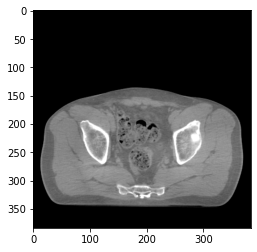

In [18]:
plt.imshow(x.squeeze(), 'gray'),

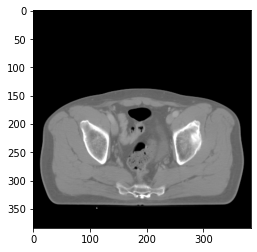

In [19]:
plt.imshow(y.squeeze(), 'gray')

In [20]:
x.shape, y.shape

((1, 384, 384), (1, 384, 384))

# Model

In [21]:
from codes.activation import Activation
import torchvision.models as models

In [24]:
class Model(nn.Module):
    def __init__(self, in_channel=1, n_classes=2, activation=None):
        
        super(Model, self).__init__()
        
        encoder = models.resnet18()
        encoder.conv1 = nn.Conv2d(in_channel, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        encoder.fc = nn.Linear(in_features=512, out_features=n_classes)
        self.encoder = encoder
        self.activation = Activation(name=activation)
        
        
    def forward(self, x):
        x = self.encoder(x)
        return self.activation(x)

# training

In [25]:
import wandb

wandb.init(project="discriminator", config={
    "data": {
        "in_channels": IN_CHANNELS,
        "out_channels": N_CLASSES,
        "batchsize": BATCH,
    },
    "epochs": EPOCH,
    "model": {
        "optimizer": OPTIM_NAME,
        "init_lr": init_lr,
        "momentum": momentum,
        "encoder": ENCODER,
        "encoder_weight": ENCODER_WEIGHT,
        "activation": ACT,
    }
})

wandb: Currently logged in as: junjun (use `wandb login --relogin` to force relogin)
wandb: wandb version 0.12.10 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [26]:
trainloader = torch.utils.data.DataLoader(trainset, batch_size=BATCH, shuffle=True, num_workers=8)
testloader = torch.utils.data.DataLoader(testset, batch_size=BATCH, shuffle=False, num_workers=4)

In [27]:
model = Model(in_channel=IN_CHANNELS, n_classes=N_CLASSES, activation=None)

In [28]:
from codes.optimizer import Optimizer
# optimizer = optim.SGD(model.parameters(), lr=init_lr, momentum=momentum)
optimizer = Optimizer(model.parameters(), name=OPTIM_NAME, lr=init_lr)

In [35]:
wandb.watch(model)

max_acc = 0

for epoch in range(EPOCH):
        
        loss = train_epoch(model, optimizer, trainloader, device)
        cbct_acc_train, ct_acc_train = eval_epoch(model, trainloader, device)
        cbct_acc_test, ct_acc_test = eval_epoch(model, testloader, device)

        
        wandb.log({
            "bce loss": loss,
            "trainset cbct acc": cbct_acc_train,
            "trainset ct acc": ct_acc_train,
            "testset cbct acc": cbct_acc_test,
            "testset ct acc": ct_acc_test
        })
        
        
        if max_acc <= cbct_acc_test + ct_acc_test:
            max_acc = cbct_acc_test + ct_acc_test
            checkpoint = {
                "model": model.state_dict(),
                "optimizer": optimizer.state_dict()
            }
            print("epoch = {}, model save".format(epoch))
            torch.save(checkpoint, os.path.join("weight-classifier", "{}.pth".format(wandb.run.name)))

153it [00:18,  6.57it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f8b619525e0>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1287, in __del__
155it [00:19,  6.26it/s]self._shutdown_workers()
  File "/opt/conda/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1261, in _shutdown_workers
156it [00:19,  6.98it/s]s.MP_STATUS_CHECK_INTERVAL)
  File "/opt/conda/lib/python3.8/multiprocessing/process.py", line 147, in join
    assert self._parent_pid == os.getpid(), 'can only join a child process'
157it [00:19,  7.19it/s]can only join a child process
159it [00:19,  7.88it/s]Exception ignored in: <function _MultiProcessingDataLoaderIter.__del__ at 0x7f8b619525e0>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.8/site-packages/torch/utils/data/dataloader.py", line 1287, in __del__
    self._shutdown_workers()
  File "/opt/conda/lib/python3.8/site-packages

epoch = 0, model save



336it [00:34,  9.66it/s]
336it [00:53,  6.28it/s]
48it [00:07,  6.25it/s]

epoch = 1, model save



336it [00:36,  9.14it/s]
336it [00:48,  6.94it/s]
48it [00:04,  9.86it/s]

epoch = 2, model save



336it [00:38,  8.83it/s]
336it [00:43,  7.69it/s]
48it [00:10,  4.74it/s]

epoch = 3, model save



336it [00:41,  8.01it/s]
336it [00:50,  6.71it/s]
48it [00:05,  8.63it/s]

epoch = 4, model save



336it [00:41,  8.17it/s]
336it [00:33,  9.97it/s]
48it [00:12,  3.78it/s]


epoch = 5, model save


336it [00:49,  6.84it/s]
336it [00:39,  8.40it/s]
48it [00:06,  6.87it/s]

epoch = 6, model save



336it [00:41,  8.14it/s]
336it [00:41,  8.02it/s]
48it [00:03, 13.75it/s]


epoch = 7, model save


336it [00:56,  5.99it/s]
336it [00:41,  8.12it/s]
48it [00:07,  6.81it/s]
336it [00:41,  8.16it/s]
336it [00:44,  7.60it/s]
48it [00:03, 12.38it/s]


epoch = 9, model save


336it [00:36,  9.27it/s]
336it [00:51,  6.50it/s]
48it [00:03, 14.18it/s]


epoch = 10, model save


336it [00:51,  6.53it/s]
336it [00:46,  7.15it/s]
48it [00:05,  9.53it/s]


epoch = 11, model save


336it [00:29, 11.52it/s]
336it [00:58,  5.74it/s]
48it [00:03, 13.65it/s]


epoch = 12, model save


336it [00:40,  8.27it/s]
336it [00:44,  7.62it/s]
48it [00:05,  9.50it/s]


epoch = 13, model save


336it [00:38,  8.71it/s]
336it [00:42,  7.85it/s]
48it [00:09,  4.86it/s]

epoch = 14, model save



336it [00:40,  8.31it/s]
336it [00:52,  6.41it/s]
48it [00:04, 11.65it/s]


epoch = 15, model save


336it [00:40,  8.23it/s]
336it [00:36,  9.28it/s]
48it [00:11,  4.30it/s]

epoch = 16, model save



336it [00:46,  7.19it/s]
336it [00:43,  7.64it/s]
48it [00:04,  9.98it/s]
336it [00:38,  8.63it/s]
336it [00:42,  7.94it/s]
48it [00:03, 13.88it/s]


epoch = 18, model save


336it [00:51,  6.52it/s]
336it [00:45,  7.39it/s]
48it [00:04, 11.26it/s]


epoch = 19, model save


336it [00:45,  7.39it/s]
336it [00:43,  7.65it/s]
48it [00:03, 12.37it/s]

epoch = 20, model save



336it [00:34,  9.64it/s]
336it [00:53,  6.27it/s]
48it [00:03, 14.44it/s]

epoch = 21, model save



336it [00:44,  7.49it/s]
336it [00:47,  7.11it/s]
48it [00:05,  8.94it/s]


epoch = 22, model save


336it [00:35,  9.37it/s]
336it [00:56,  5.91it/s]
48it [00:07,  6.22it/s]


epoch = 23, model save


336it [00:33,  9.88it/s]
336it [00:48,  6.98it/s]
48it [00:04,  9.87it/s]


epoch = 24, model save


336it [00:38,  8.77it/s]
336it [00:39,  8.54it/s]
48it [00:11,  4.09it/s]
336it [00:42,  7.95it/s]
336it [00:52,  6.40it/s]
48it [00:05,  9.39it/s]


epoch = 26, model save


336it [00:38,  8.67it/s]
336it [00:39,  8.60it/s]
48it [00:11,  4.21it/s]

epoch = 27, model save



336it [00:46,  7.21it/s]
336it [00:44,  7.58it/s]
48it [00:05,  8.62it/s]


epoch = 28, model save


336it [00:39,  8.49it/s]
336it [00:41,  8.06it/s]
48it [00:03, 13.42it/s]


epoch = 29, model save


336it [00:54,  6.16it/s]
336it [00:43,  7.76it/s]
48it [00:10,  4.51it/s]


epoch = 30, model save


336it [00:40,  8.20it/s]
336it [00:42,  7.85it/s]
48it [00:03, 14.14it/s]


epoch = 31, model save


336it [00:39,  8.43it/s]
336it [00:49,  6.77it/s]
48it [00:03, 14.19it/s]


epoch = 32, model save


336it [00:46,  7.22it/s]
336it [00:48,  6.99it/s]
48it [00:05,  8.66it/s]


epoch = 33, model save


336it [00:33, 10.01it/s]
336it [00:56,  5.93it/s]
48it [00:06,  7.84it/s]


epoch = 34, model save


336it [00:34,  9.87it/s]
336it [00:49,  6.75it/s]
48it [00:04, 10.22it/s]


epoch = 35, model save


336it [00:38,  8.83it/s]
336it [00:35,  9.45it/s]
48it [00:10,  4.54it/s]

epoch = 36, model save



336it [00:46,  7.29it/s]
336it [00:50,  6.64it/s]
48it [00:04,  9.75it/s]


epoch = 37, model save


336it [00:41,  8.05it/s]
336it [00:36,  9.27it/s]
48it [00:05,  8.65it/s]


epoch = 38, model save


336it [00:52,  6.44it/s]
336it [00:39,  8.46it/s]
48it [00:11,  4.23it/s]


epoch = 39, model save


336it [00:39,  8.59it/s]
336it [00:42,  7.89it/s]
48it [00:03, 13.30it/s]
336it [00:44,  7.50it/s]
336it [00:46,  7.24it/s]
48it [00:09,  5.26it/s]


epoch = 41, model save


336it [00:46,  7.21it/s]
336it [00:43,  7.73it/s]
48it [00:04, 10.68it/s]


epoch = 42, model save


336it [00:29, 11.31it/s]
336it [00:57,  5.88it/s]
48it [00:05,  8.22it/s]


epoch = 43, model save


336it [00:33, 10.16it/s]
336it [00:52,  6.46it/s]
48it [00:05,  9.02it/s]


epoch = 44, model save


336it [00:37,  9.05it/s]
336it [00:52,  6.34it/s]
48it [00:07,  6.28it/s]


epoch = 45, model save


336it [00:38,  8.76it/s]
336it [00:47,  7.07it/s]
48it [00:04, 10.50it/s]


epoch = 46, model save


336it [00:38,  8.77it/s]
336it [00:33,  9.98it/s]
48it [00:13,  3.68it/s]


epoch = 47, model save


336it [00:48,  6.97it/s]
336it [00:45,  7.32it/s]
48it [00:07,  6.65it/s]


epoch = 48, model save


336it [00:41,  8.08it/s]
336it [00:39,  8.42it/s]
48it [00:03, 13.38it/s]

epoch = 49, model save



336it [00:49,  6.83it/s]
336it [00:42,  7.85it/s]
48it [00:05,  9.52it/s]

epoch = 50, model save



336it [00:45,  7.36it/s]
336it [00:42,  7.82it/s]
48it [00:03, 12.14it/s]


epoch = 51, model save


336it [00:31, 10.57it/s]
336it [00:59,  5.64it/s]
48it [00:03, 13.91it/s]


epoch = 52, model save


336it [00:44,  7.56it/s]
336it [00:46,  7.20it/s]
48it [00:04, 10.43it/s]


epoch = 53, model save


336it [00:35,  9.41it/s]
336it [00:47,  7.08it/s]
48it [00:05,  8.10it/s]


epoch = 54, model save


336it [00:39,  8.56it/s]
336it [00:48,  6.95it/s]
48it [00:05,  9.00it/s]


epoch = 55, model save


336it [00:41,  8.02it/s]
336it [00:37,  8.97it/s]
48it [00:13,  3.54it/s]
336it [00:48,  6.92it/s]
336it [00:44,  7.52it/s]
48it [00:05,  9.25it/s]


epoch = 57, model save


336it [00:39,  8.53it/s]
336it [00:39,  8.40it/s]
48it [00:03, 14.37it/s]

epoch = 58, model save



336it [00:46,  7.16it/s]
336it [00:45,  7.42it/s]
48it [00:05,  8.55it/s]


epoch = 59, model save


336it [00:48,  6.99it/s]
336it [00:46,  7.15it/s]
48it [00:03, 13.97it/s]


epoch = 60, model save


336it [00:41,  8.18it/s]
336it [00:47,  7.01it/s]
48it [00:03, 13.97it/s]


epoch = 61, model save


336it [00:46,  7.26it/s]
336it [00:44,  7.63it/s]
48it [00:04,  9.67it/s]


epoch = 62, model save


336it [00:34,  9.61it/s]
336it [00:54,  6.19it/s]
48it [00:07,  6.66it/s]

epoch = 63, model save



336it [00:39,  8.48it/s]
336it [00:49,  6.74it/s]
48it [00:05,  9.05it/s]


epoch = 64, model save


336it [00:37,  8.89it/s]
336it [00:37,  9.01it/s]
48it [00:10,  4.46it/s]

epoch = 65, model save



336it [00:46,  7.24it/s]
336it [00:42,  7.99it/s]
48it [00:05,  8.13it/s]


epoch = 66, model save


336it [00:41,  8.01it/s]
336it [00:40,  8.33it/s]
48it [00:03, 13.55it/s]


epoch = 67, model save


336it [00:55,  6.10it/s]
336it [00:42,  8.00it/s]
48it [00:07,  6.28it/s]


epoch = 68, model save


336it [00:41,  8.09it/s]
336it [00:44,  7.58it/s]
48it [00:03, 13.44it/s]

epoch = 69, model save



336it [00:36,  9.32it/s]
336it [00:50,  6.66it/s]
48it [00:03, 13.68it/s]


epoch = 70, model save


336it [00:48,  6.88it/s]
336it [00:46,  7.18it/s]
48it [00:05,  9.23it/s]


epoch = 71, model save


336it [00:32, 10.30it/s]
336it [00:54,  6.21it/s]
48it [00:06,  6.96it/s]

epoch = 72, model save



336it [00:35,  9.56it/s]
336it [00:47,  7.02it/s]
48it [00:04, 10.13it/s]

epoch = 73, model save



336it [00:37,  9.01it/s]
336it [00:32, 10.25it/s]
48it [00:13,  3.54it/s]


epoch = 74, model save


336it [00:50,  6.64it/s]
336it [00:48,  6.99it/s]
48it [00:05,  9.39it/s]


epoch = 75, model save


336it [00:41,  8.12it/s]
336it [00:38,  8.76it/s]
48it [00:03, 14.36it/s]


epoch = 76, model save


336it [00:47,  7.03it/s]
336it [00:43,  7.69it/s]
48it [00:04, 10.04it/s]


epoch = 77, model save


336it [00:46,  7.27it/s]
336it [00:47,  7.13it/s]
48it [00:03, 13.54it/s]


epoch = 78, model save


336it [00:39,  8.54it/s]
336it [00:50,  6.64it/s]
48it [00:02, 16.01it/s]


epoch = 79, model save


336it [00:48,  6.99it/s]
336it [00:43,  7.75it/s]
48it [00:04, 10.31it/s]


epoch = 80, model save


336it [00:35,  9.56it/s]
336it [00:47,  7.06it/s]
48it [00:06,  7.30it/s]

epoch = 81, model save



336it [00:37,  8.89it/s]
336it [00:51,  6.58it/s]
48it [00:05,  8.84it/s]


epoch = 82, model save


336it [00:40,  8.21it/s]
336it [00:37,  8.87it/s]
48it [00:11,  4.12it/s]


epoch = 83, model save


336it [00:46,  7.24it/s]
336it [00:44,  7.50it/s]
48it [00:04,  9.95it/s]


epoch = 84, model save


336it [00:39,  8.55it/s]
336it [00:40,  8.32it/s]
48it [00:03, 15.70it/s]


epoch = 85, model save


336it [00:48,  6.94it/s]
336it [00:47,  7.14it/s]
48it [00:05,  8.05it/s]


epoch = 86, model save


336it [00:46,  7.18it/s]
336it [00:45,  7.32it/s]
48it [00:03, 13.48it/s]


epoch = 87, model save


336it [00:37,  8.95it/s]
336it [00:50,  6.59it/s]
48it [00:03, 14.23it/s]


epoch = 88, model save


336it [00:43,  7.67it/s]
336it [00:43,  7.68it/s]
48it [00:05,  9.06it/s]


epoch = 89, model save


336it [00:35,  9.43it/s]
336it [00:54,  6.21it/s]
48it [00:08,  5.38it/s]

epoch = 90, model save



336it [00:36,  9.17it/s]
336it [00:48,  7.00it/s]
48it [00:04, 10.63it/s]


epoch = 91, model save


336it [00:37,  8.99it/s]
336it [00:33,  9.99it/s]
48it [00:11,  4.05it/s]


epoch = 92, model save


336it [00:48,  6.98it/s]
336it [00:41,  8.00it/s]
48it [00:07,  6.74it/s]


epoch = 93, model save


336it [00:41,  8.17it/s]
336it [00:41,  8.12it/s]
48it [00:03, 13.22it/s]


epoch = 94, model save


336it [00:49,  6.80it/s]
336it [00:42,  7.87it/s]
48it [00:04, 10.45it/s]


epoch = 95, model save


336it [00:45,  7.35it/s]
336it [00:44,  7.57it/s]
48it [00:04, 10.19it/s]


epoch = 96, model save


336it [00:29, 11.23it/s]
336it [00:58,  5.77it/s]
48it [00:03, 13.54it/s]


epoch = 97, model save


336it [00:45,  7.39it/s]
336it [00:46,  7.22it/s]
48it [00:04, 11.69it/s]


epoch = 98, model save


336it [00:37,  8.99it/s]
336it [00:51,  6.49it/s]
48it [00:06,  7.53it/s]

epoch = 99, model save


In [38]:
run_name = wandb.run.name
# run_name = "unique-sunset-49"

In [39]:
checkpoint = torch.load(os.path.join("weight-classifier", "{}.pth".format(run_name)))

In [40]:
model = Model(in_channel=IN_CHANNELS, n_classes=N_CLASSES, activation=None)
model.load_state_dict(checkpoint["model"])

<All keys matched successfully>

In [41]:
model

Model(
  (encoder): ResNet(
    (conv1): Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_runni

In [46]:
# cbct_acc_test, ct_acc_test
eval_epoch(model, testloader, device)

191it [00:10, 18.28it/s]


(1.0, 1.0)

In [47]:
path_dir = os.path.join("eval-cls", wandb.run.name)
os.mkdir(path_dir)

0it [00:00, ?it/s]

cbct prediction: 1, ct prediction: 0


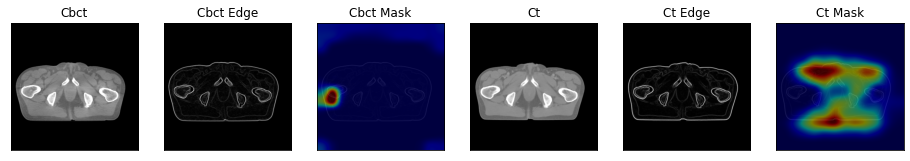

1it [00:00,  2.34it/s]

cbct prediction: 1, ct prediction: 0


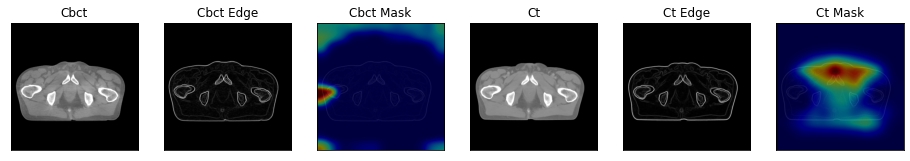

2it [00:00,  2.53it/s]

cbct prediction: 1, ct prediction: 0


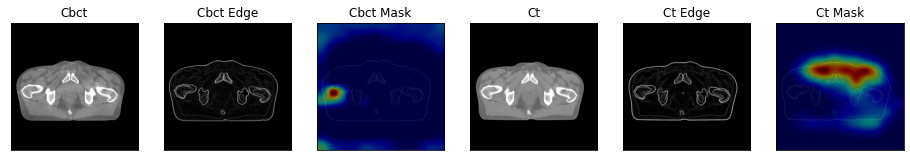

3it [00:01,  2.69it/s]

cbct prediction: 1, ct prediction: 0


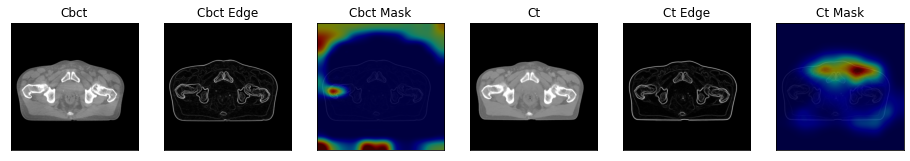

4it [00:01,  2.34it/s]

cbct prediction: 1, ct prediction: 0


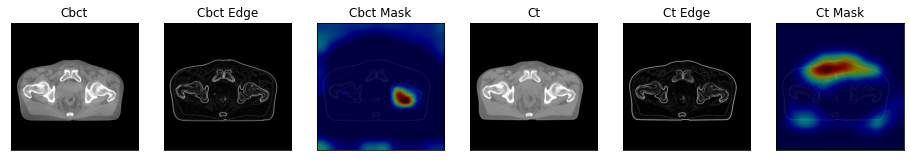

5it [00:02,  2.31it/s]

cbct prediction: 1, ct prediction: 0


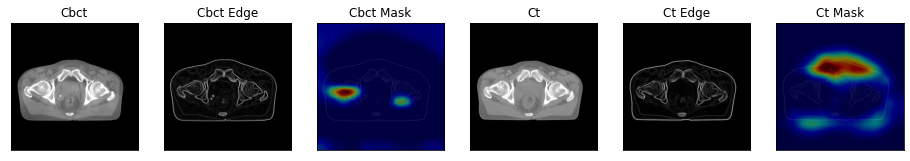

6it [00:02,  2.02it/s]

cbct prediction: 1, ct prediction: 0


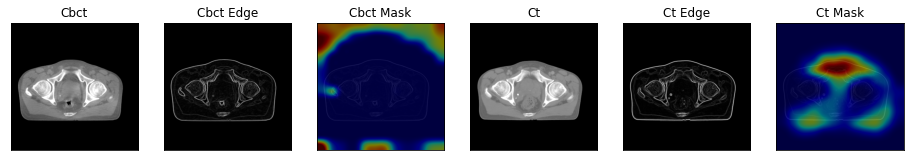

7it [00:03,  1.73it/s]

cbct prediction: 1, ct prediction: 0


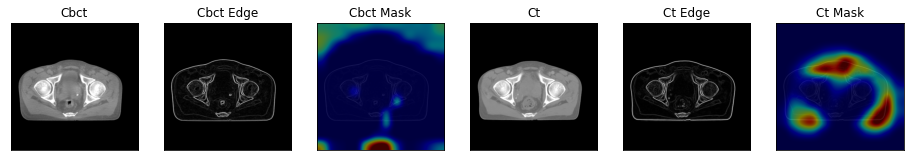

8it [00:03,  1.92it/s]

cbct prediction: 1, ct prediction: 0


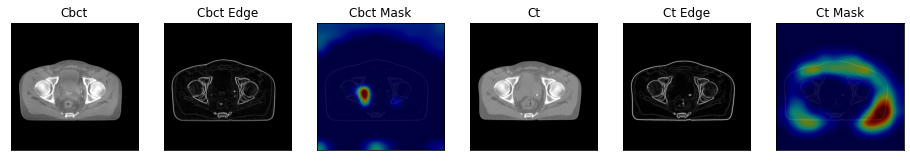

9it [00:04,  2.10it/s]

cbct prediction: 1, ct prediction: 0


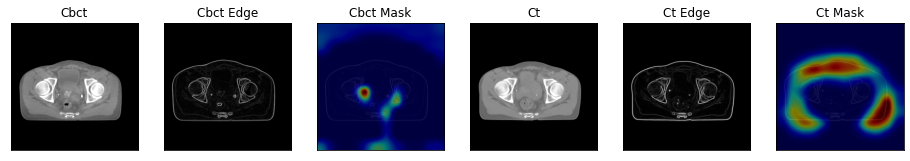

10it [00:04,  2.30it/s]

cbct prediction: 1, ct prediction: 0


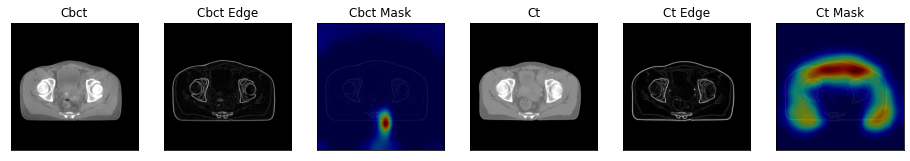

11it [00:04,  2.47it/s]

cbct prediction: 1, ct prediction: 0


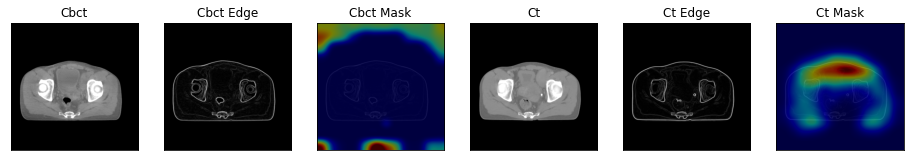

12it [00:05,  2.64it/s]

cbct prediction: 1, ct prediction: 0


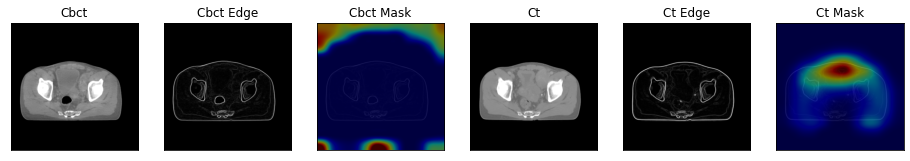

13it [00:05,  2.71it/s]

cbct prediction: 1, ct prediction: 0


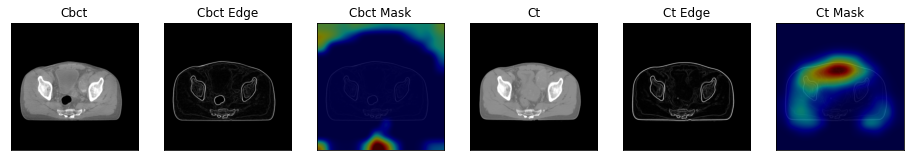

14it [00:05,  2.79it/s]

cbct prediction: 1, ct prediction: 0


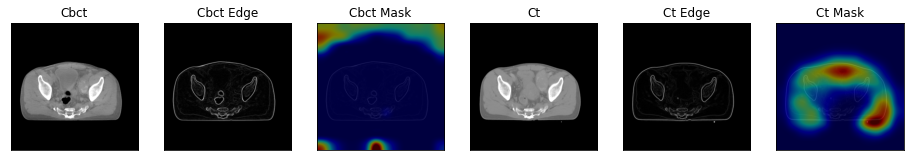

15it [00:06,  2.90it/s]

cbct prediction: 1, ct prediction: 0


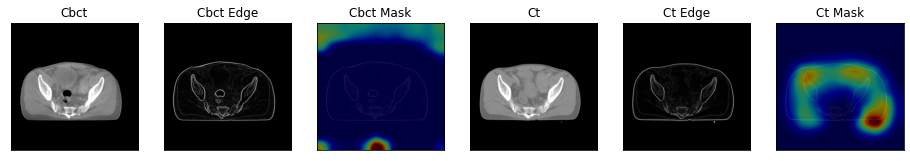

16it [00:06,  2.94it/s]

cbct prediction: 1, ct prediction: 0


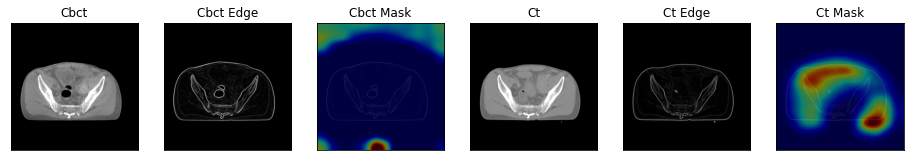

17it [00:06,  2.96it/s]

cbct prediction: 1, ct prediction: 0


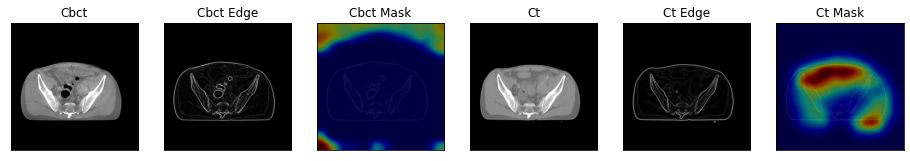

18it [00:07,  3.01it/s]

cbct prediction: 1, ct prediction: 0


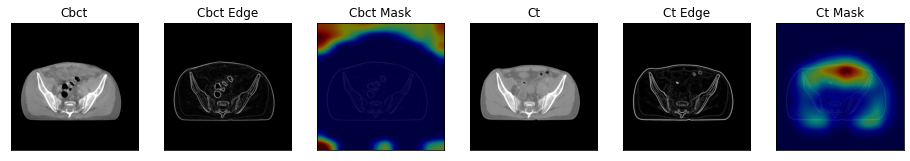

19it [00:07,  3.02it/s]

cbct prediction: 1, ct prediction: 0


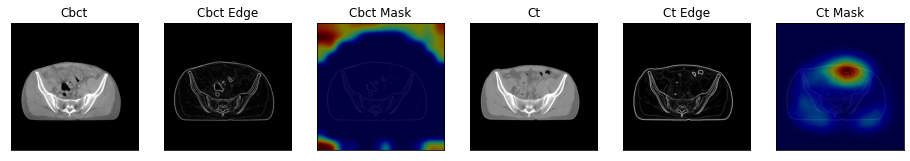

20it [00:08,  2.50it/s]

cbct prediction: 1, ct prediction: 0


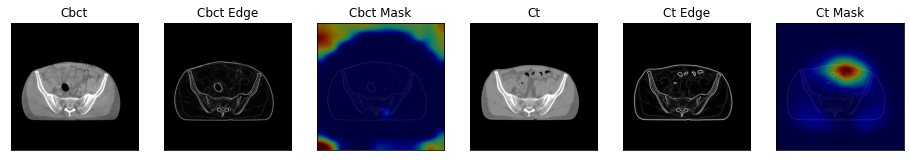

21it [00:08,  2.61it/s]

cbct prediction: 1, ct prediction: 0


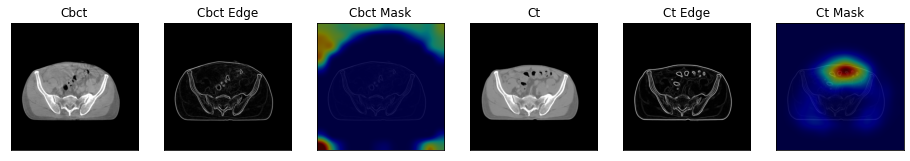

22it [00:08,  2.72it/s]

cbct prediction: 1, ct prediction: 0


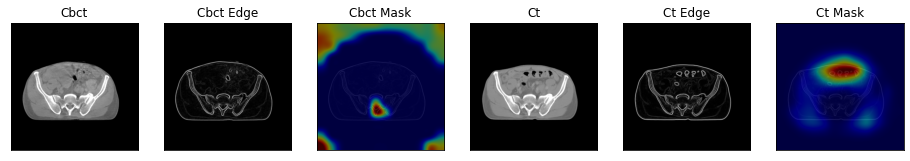

23it [00:09,  2.84it/s]

cbct prediction: 1, ct prediction: 0


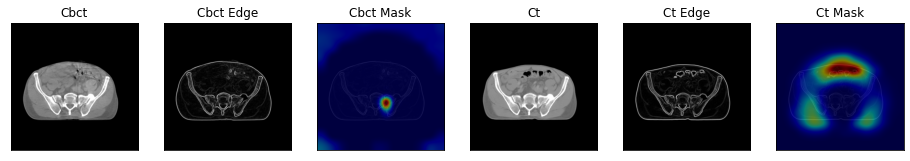

24it [00:09,  2.93it/s]

cbct prediction: 1, ct prediction: 0


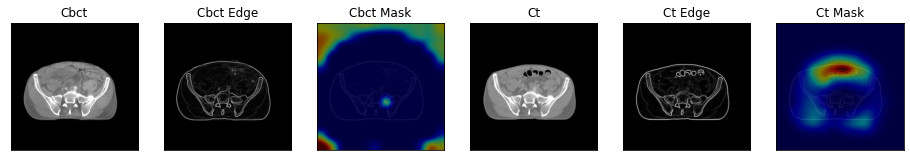

25it [00:09,  2.94it/s]

cbct prediction: 1, ct prediction: 0


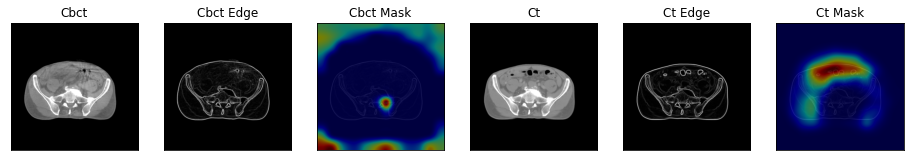

26it [00:10,  2.94it/s]

cbct prediction: 1, ct prediction: 0


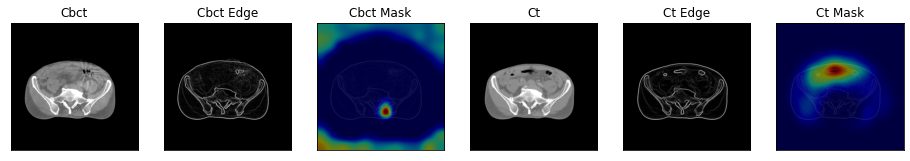

27it [00:10,  2.99it/s]

cbct prediction: 1, ct prediction: 0


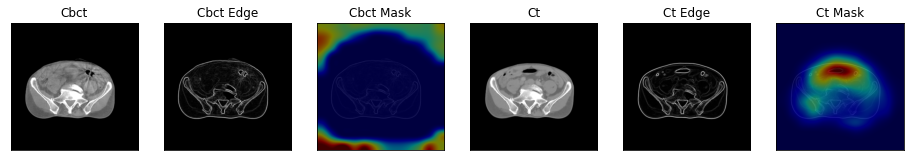

28it [00:10,  2.96it/s]

cbct prediction: 1, ct prediction: 0


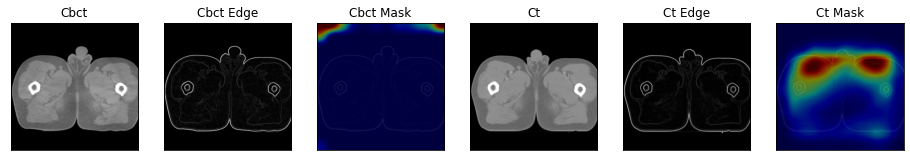

29it [00:11,  2.96it/s]

cbct prediction: 1, ct prediction: 0


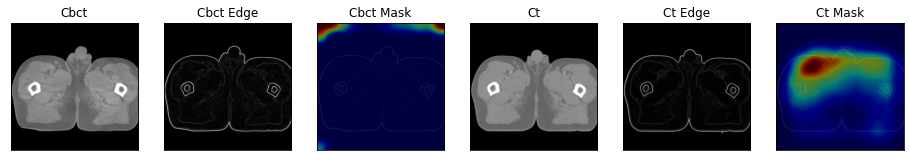

30it [00:11,  2.96it/s]

cbct prediction: 1, ct prediction: 0


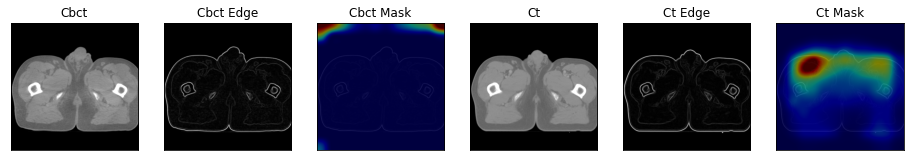

31it [00:11,  2.94it/s]

cbct prediction: 1, ct prediction: 0


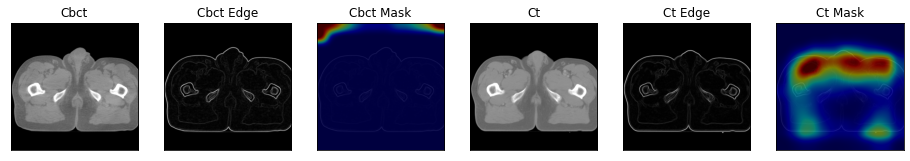

32it [00:12,  3.02it/s]

cbct prediction: 1, ct prediction: 0


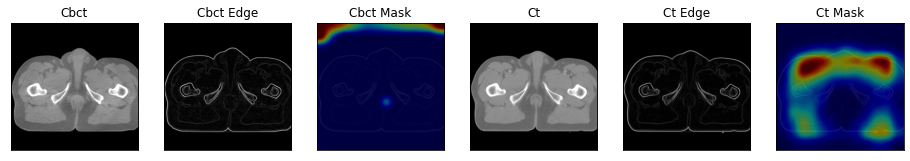

33it [00:12,  3.03it/s]

cbct prediction: 1, ct prediction: 0


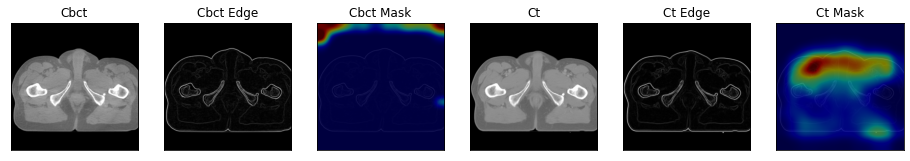

34it [00:12,  3.01it/s]

cbct prediction: 1, ct prediction: 0


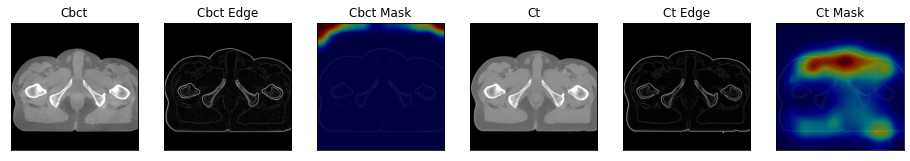

35it [00:13,  3.00it/s]

cbct prediction: 1, ct prediction: 0


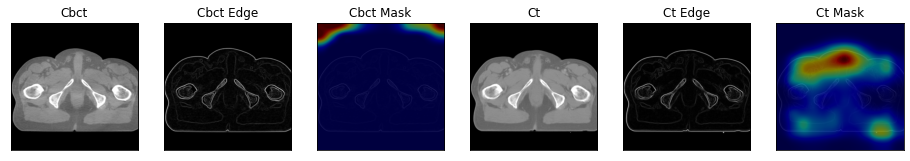

36it [00:13,  2.49it/s]

cbct prediction: 1, ct prediction: 0


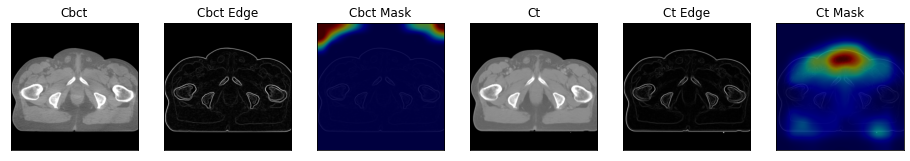

37it [00:13,  2.61it/s]

cbct prediction: 1, ct prediction: 0


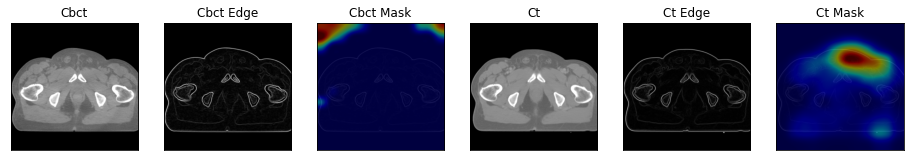

38it [00:14,  2.75it/s]

cbct prediction: 1, ct prediction: 0


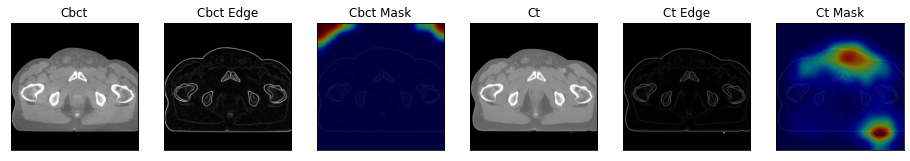

39it [00:14,  2.85it/s]

cbct prediction: 1, ct prediction: 0


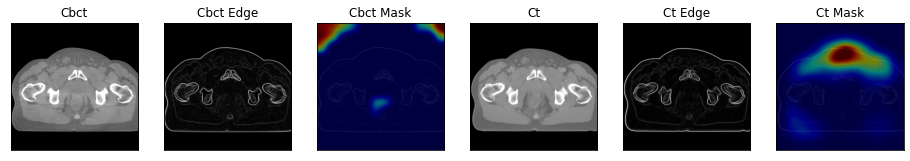

40it [00:14,  2.86it/s]

cbct prediction: 1, ct prediction: 0


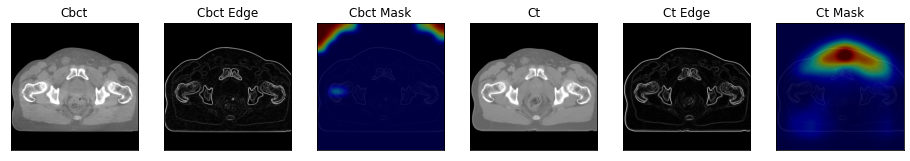

41it [00:15,  2.83it/s]

cbct prediction: 1, ct prediction: 0


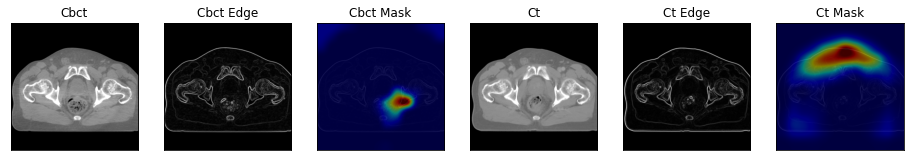

42it [00:15,  2.88it/s]

cbct prediction: 1, ct prediction: 0


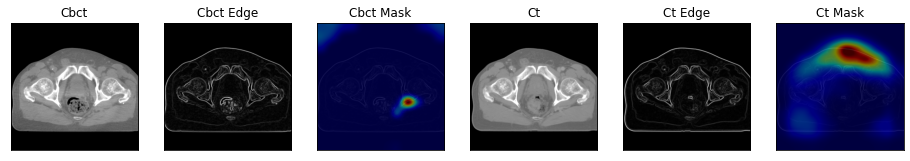

43it [00:15,  2.90it/s]

cbct prediction: 1, ct prediction: 0


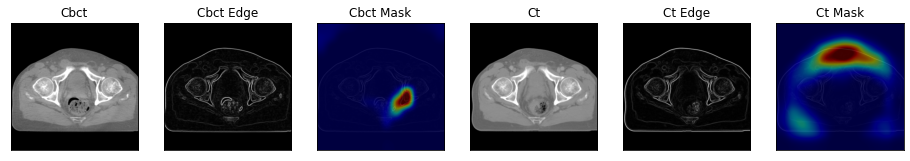

44it [00:16,  2.90it/s]

cbct prediction: 1, ct prediction: 0


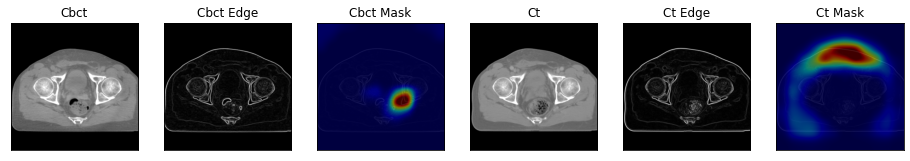

45it [00:16,  2.94it/s]

cbct prediction: 1, ct prediction: 0


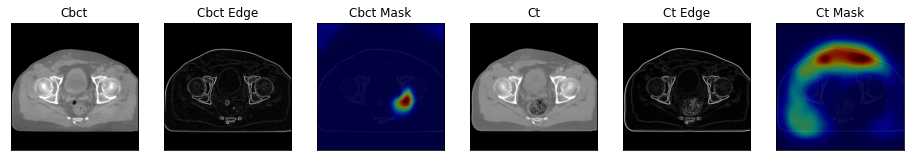

46it [00:17,  2.93it/s]

cbct prediction: 1, ct prediction: 0


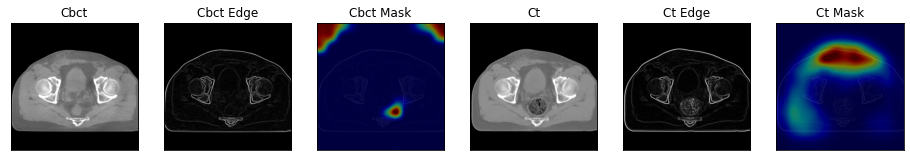

47it [00:17,  2.95it/s]

cbct prediction: 1, ct prediction: 0


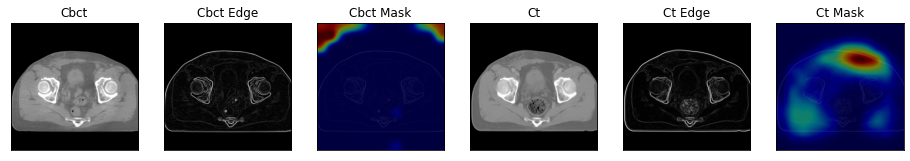

48it [00:17,  2.99it/s]

cbct prediction: 1, ct prediction: 0


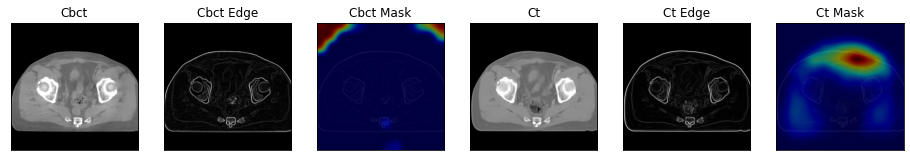

49it [00:18,  3.01it/s]

cbct prediction: 1, ct prediction: 0


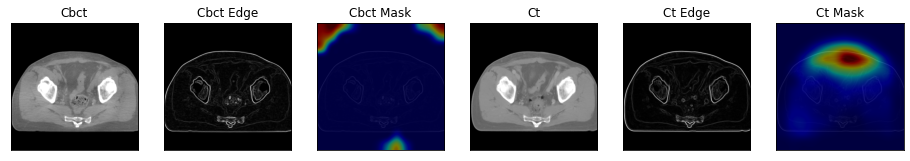

50it [00:18,  2.98it/s]

cbct prediction: 1, ct prediction: 0


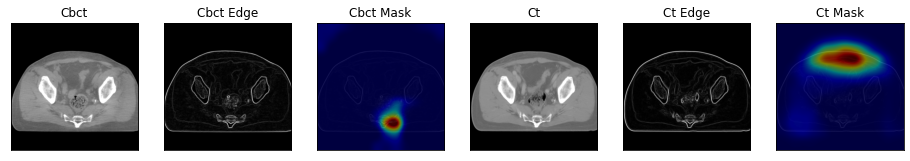

51it [00:18,  3.01it/s]

cbct prediction: 1, ct prediction: 0


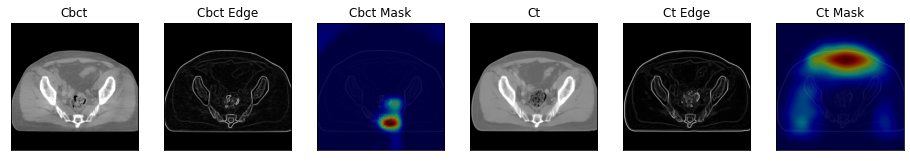

52it [00:19,  2.38it/s]

cbct prediction: 1, ct prediction: 0


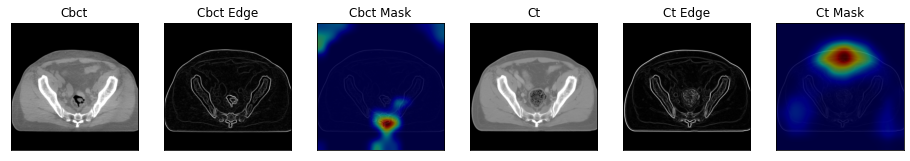

53it [00:19,  2.56it/s]

cbct prediction: 1, ct prediction: 0


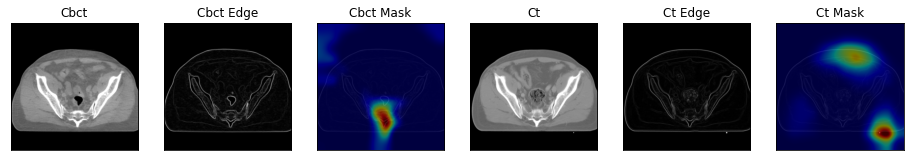

54it [00:19,  2.68it/s]

cbct prediction: 1, ct prediction: 0


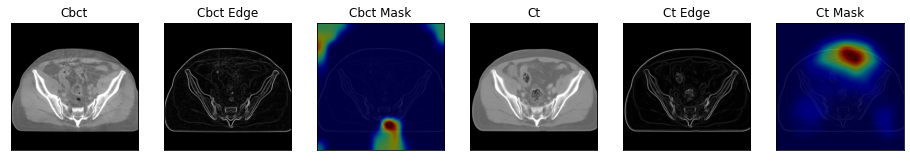

55it [00:20,  2.75it/s]

cbct prediction: 1, ct prediction: 0


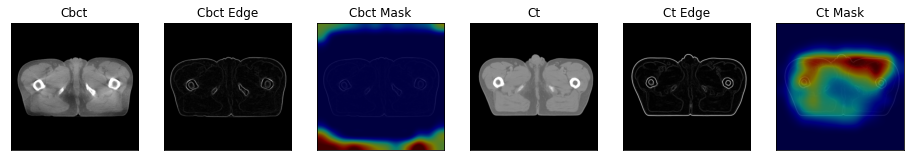

56it [00:20,  2.90it/s]

cbct prediction: 1, ct prediction: 0


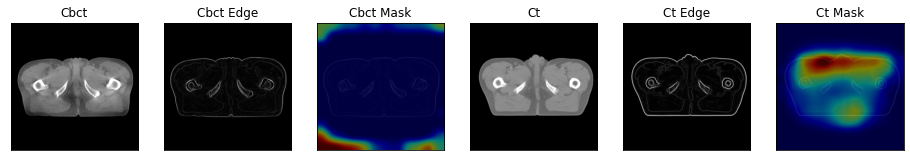

57it [00:20,  2.95it/s]

cbct prediction: 1, ct prediction: 0


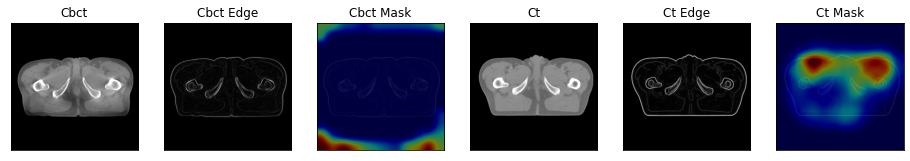

58it [00:21,  2.96it/s]

cbct prediction: 1, ct prediction: 0


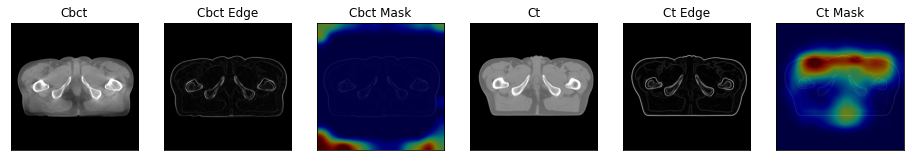

59it [00:21,  2.99it/s]

cbct prediction: 1, ct prediction: 0


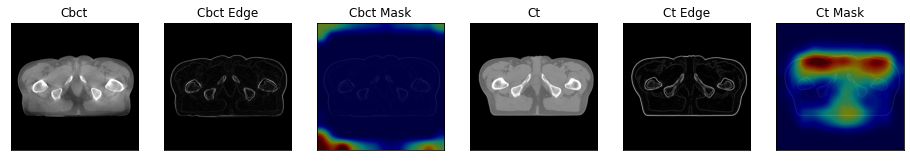

60it [00:21,  3.06it/s]

cbct prediction: 1, ct prediction: 0


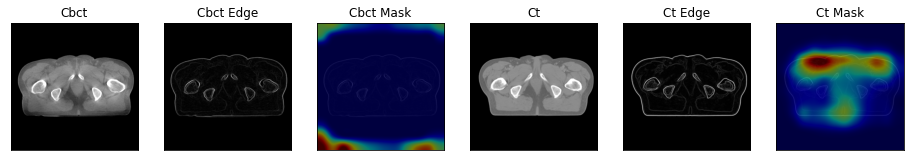

61it [00:22,  3.03it/s]

cbct prediction: 1, ct prediction: 0


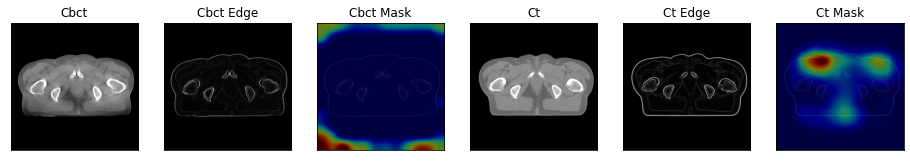

62it [00:22,  3.05it/s]

cbct prediction: 1, ct prediction: 0


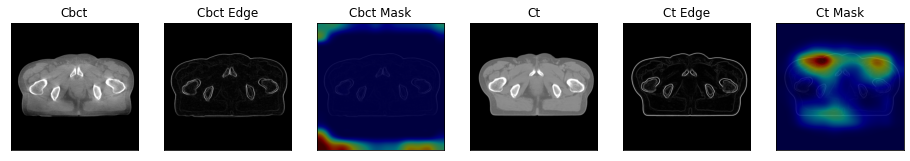

63it [00:22,  3.10it/s]

cbct prediction: 1, ct prediction: 0


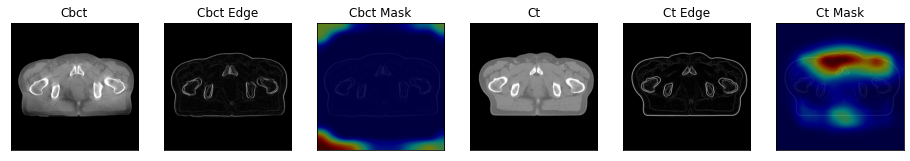

64it [00:23,  3.09it/s]

cbct prediction: 1, ct prediction: 0


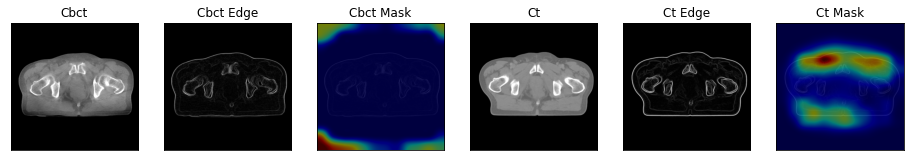

65it [00:23,  3.06it/s]

cbct prediction: 1, ct prediction: 0


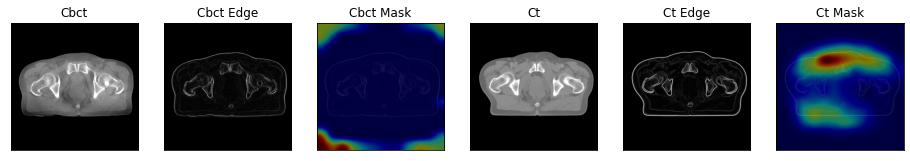

66it [00:23,  3.05it/s]

cbct prediction: 1, ct prediction: 0


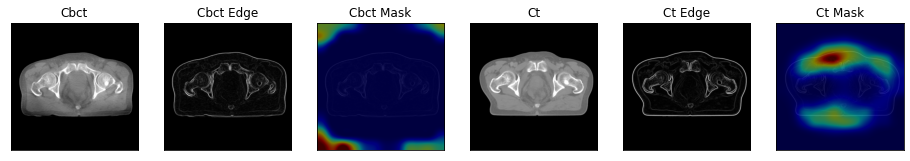

67it [00:24,  3.07it/s]

cbct prediction: 1, ct prediction: 0


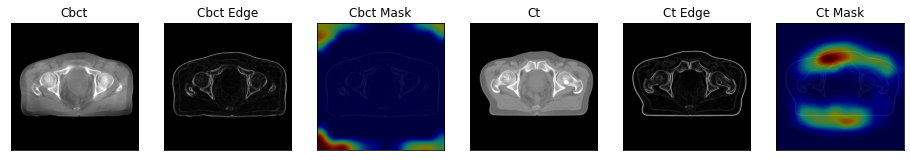

68it [00:24,  2.46it/s]

cbct prediction: 1, ct prediction: 0


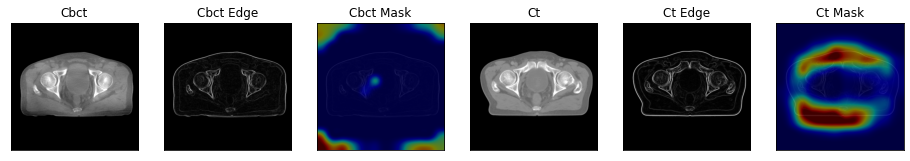

69it [00:25,  2.64it/s]

cbct prediction: 1, ct prediction: 0


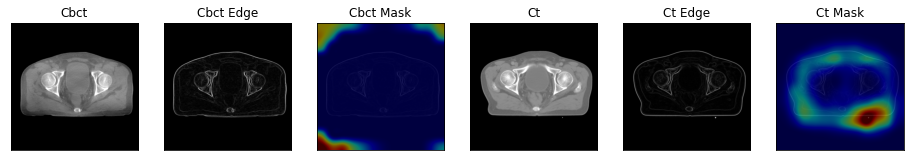

70it [00:25,  2.73it/s]

cbct prediction: 1, ct prediction: 0


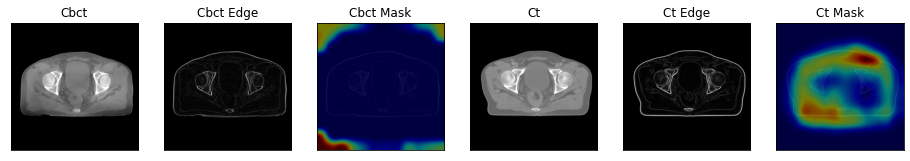

71it [00:25,  2.76it/s]

cbct prediction: 1, ct prediction: 0


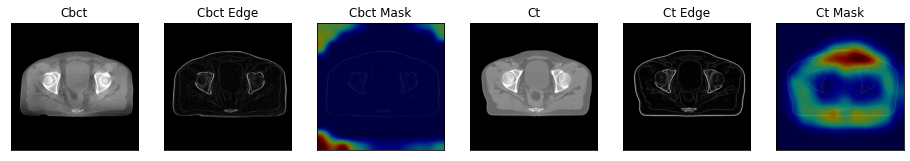

72it [00:26,  2.83it/s]

cbct prediction: 1, ct prediction: 0


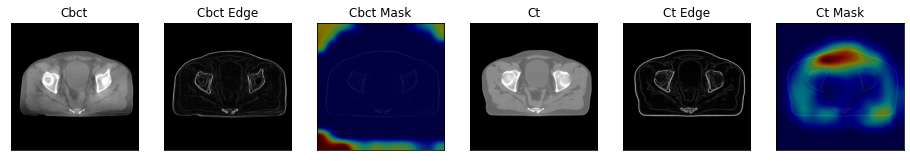

73it [00:26,  2.87it/s]

cbct prediction: 1, ct prediction: 0


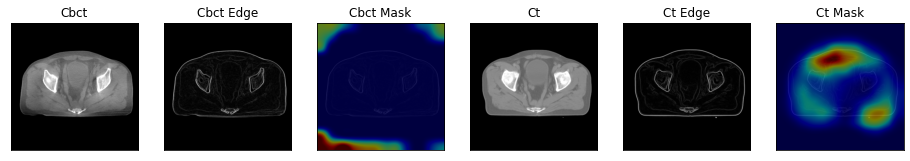

74it [00:26,  2.90it/s]

cbct prediction: 1, ct prediction: 0


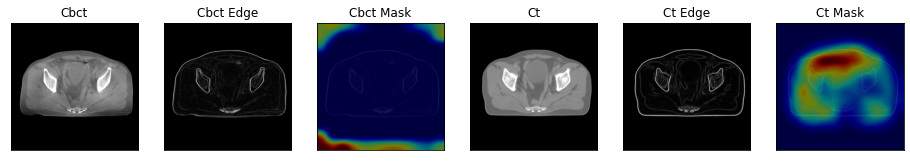

75it [00:27,  2.99it/s]

cbct prediction: 1, ct prediction: 0


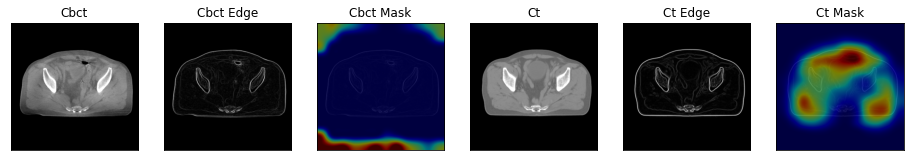

76it [00:27,  2.98it/s]

cbct prediction: 1, ct prediction: 0


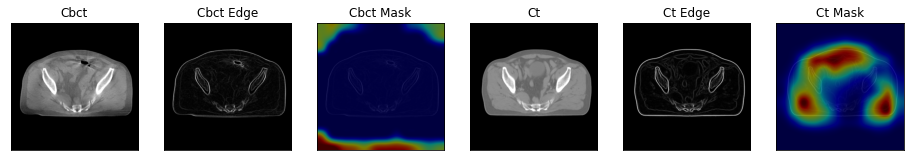

77it [00:27,  3.01it/s]

cbct prediction: 1, ct prediction: 0


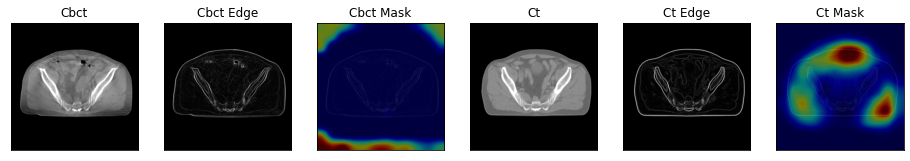

78it [00:28,  3.06it/s]

cbct prediction: 1, ct prediction: 0


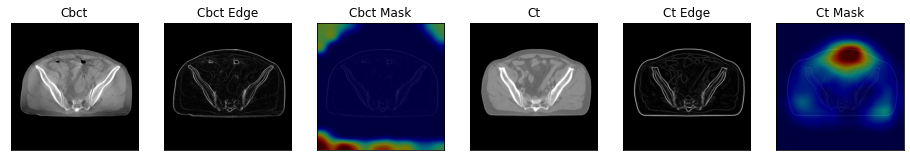

79it [00:28,  3.02it/s]

cbct prediction: 1, ct prediction: 0


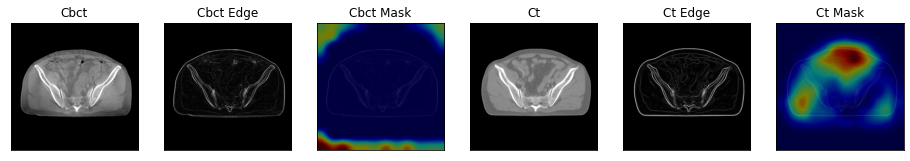

80it [00:28,  3.06it/s]

cbct prediction: 1, ct prediction: 0


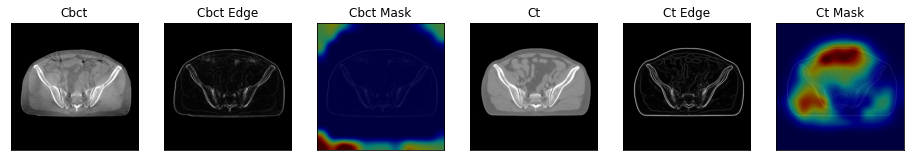

81it [00:29,  3.08it/s]

cbct prediction: 1, ct prediction: 0


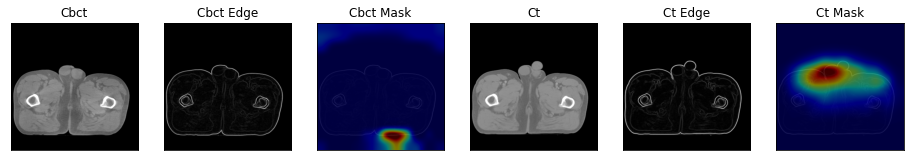

82it [00:29,  3.09it/s]

cbct prediction: 1, ct prediction: 0


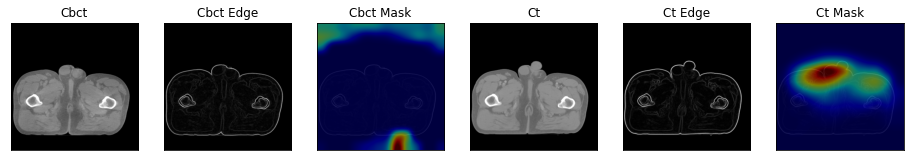

83it [00:29,  3.10it/s]

cbct prediction: 1, ct prediction: 0


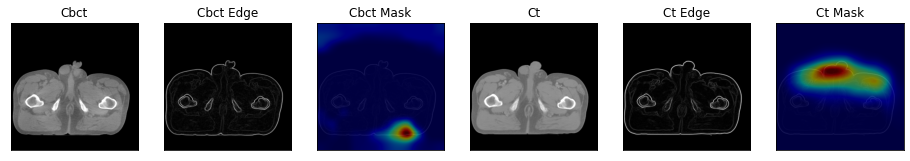

84it [00:30,  2.58it/s]

cbct prediction: 1, ct prediction: 0


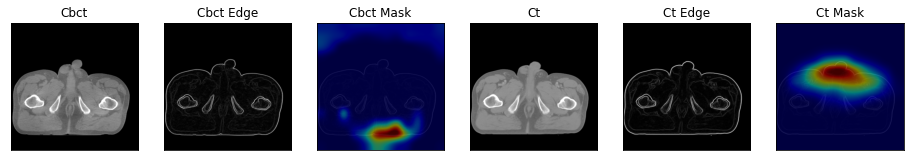

85it [00:30,  2.68it/s]

cbct prediction: 1, ct prediction: 0


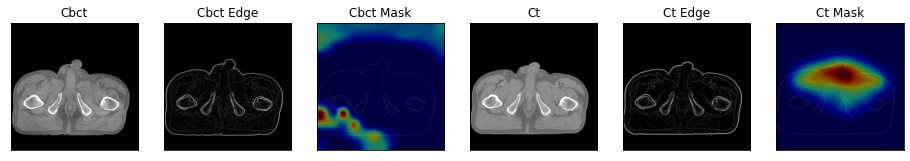

86it [00:30,  2.78it/s]

cbct prediction: 1, ct prediction: 0


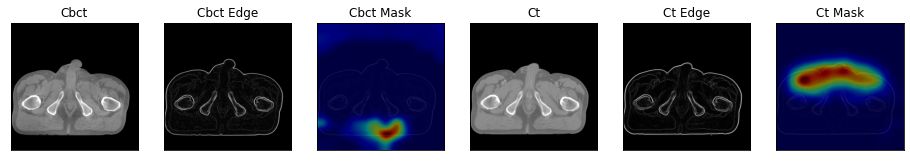

87it [00:31,  2.87it/s]

cbct prediction: 1, ct prediction: 0


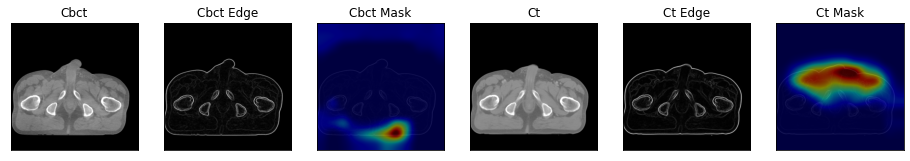

88it [00:31,  2.90it/s]

cbct prediction: 1, ct prediction: 0


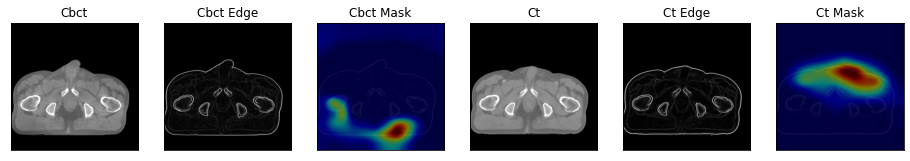

89it [00:31,  2.89it/s]

cbct prediction: 1, ct prediction: 0


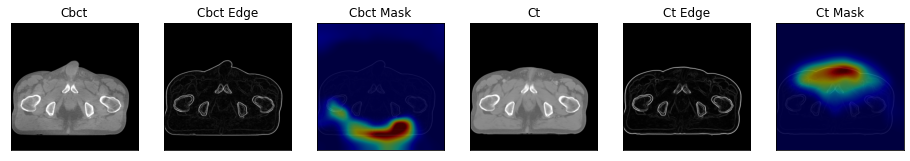

90it [00:32,  2.95it/s]

cbct prediction: 1, ct prediction: 0


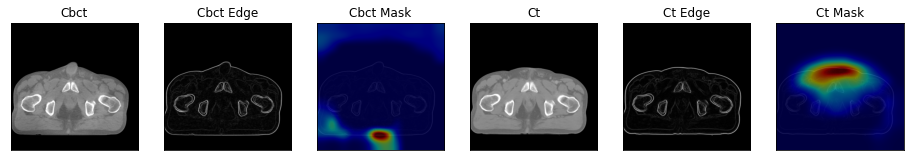

91it [00:32,  2.94it/s]

cbct prediction: 1, ct prediction: 0


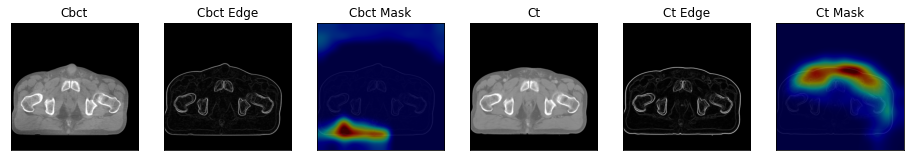

92it [00:32,  2.97it/s]

cbct prediction: 1, ct prediction: 0


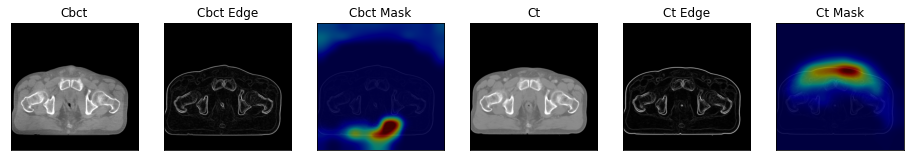

93it [00:33,  3.00it/s]

cbct prediction: 1, ct prediction: 0


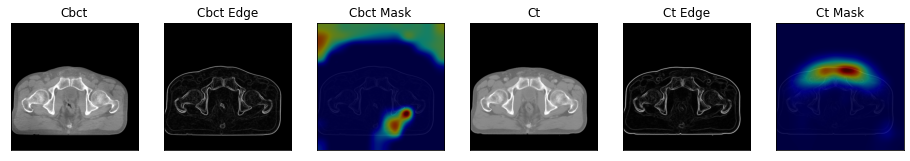

94it [00:33,  2.98it/s]

cbct prediction: 1, ct prediction: 0


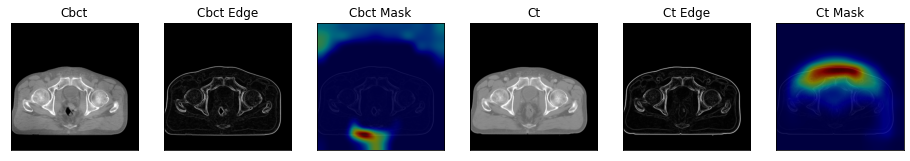

95it [00:33,  3.00it/s]

cbct prediction: 1, ct prediction: 0


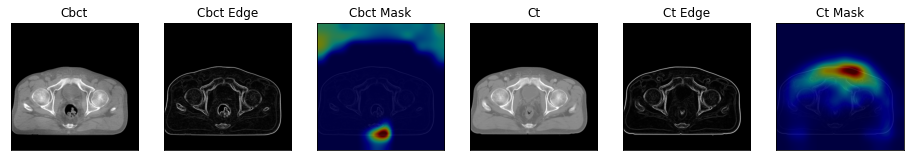

96it [00:34,  3.03it/s]

cbct prediction: 1, ct prediction: 0


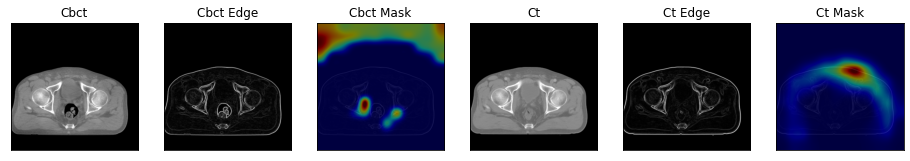

97it [00:34,  3.03it/s]

cbct prediction: 1, ct prediction: 0


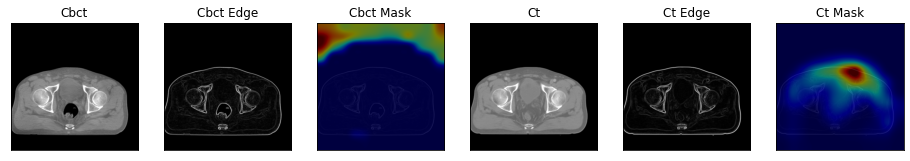

98it [00:34,  2.99it/s]

cbct prediction: 1, ct prediction: 0


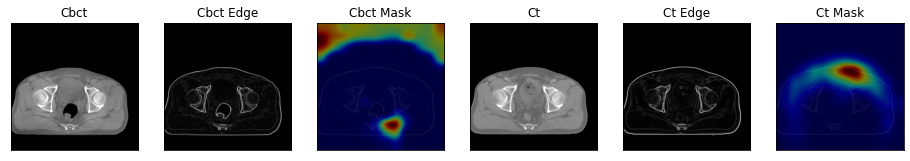

99it [00:35,  3.01it/s]

cbct prediction: 1, ct prediction: 0


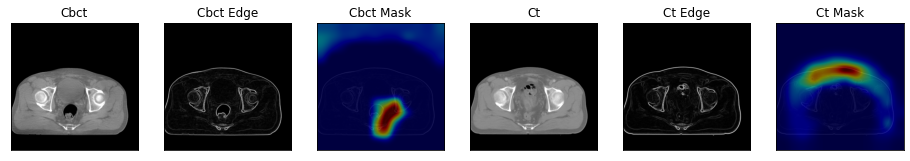

100it [00:35,  2.42it/s]

cbct prediction: 1, ct prediction: 0


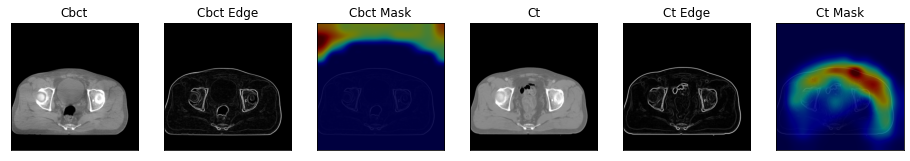

101it [00:36,  2.58it/s]

cbct prediction: 1, ct prediction: 0


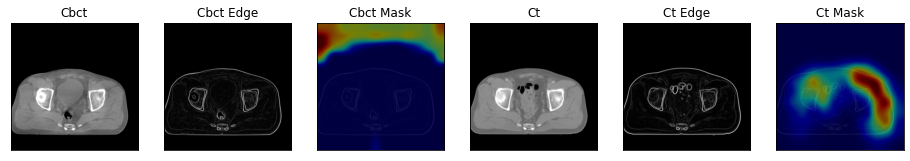

102it [00:36,  2.68it/s]

cbct prediction: 1, ct prediction: 0


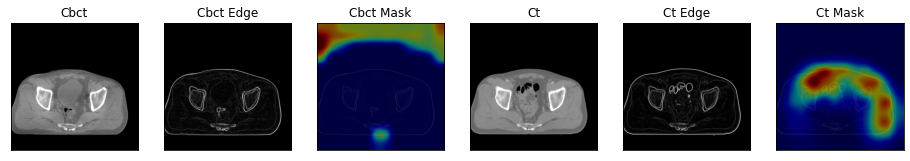

103it [00:36,  2.77it/s]

cbct prediction: 1, ct prediction: 0


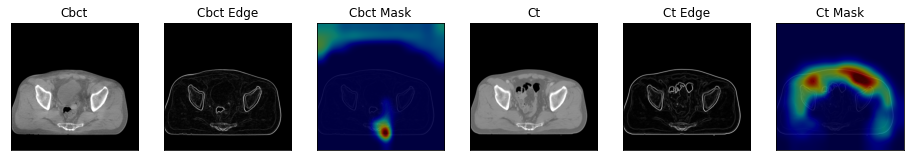

104it [00:37,  2.85it/s]

cbct prediction: 1, ct prediction: 0


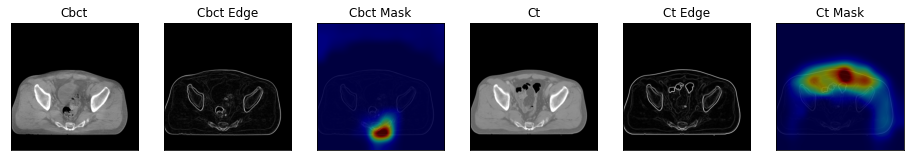

105it [00:37,  2.89it/s]

cbct prediction: 1, ct prediction: 0


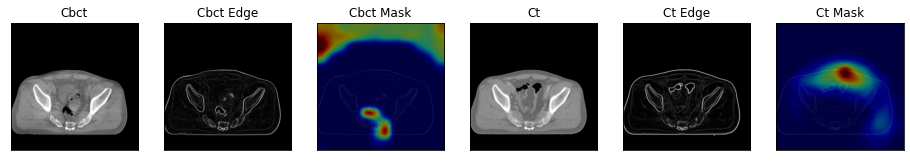

106it [00:37,  2.92it/s]

cbct prediction: 1, ct prediction: 0


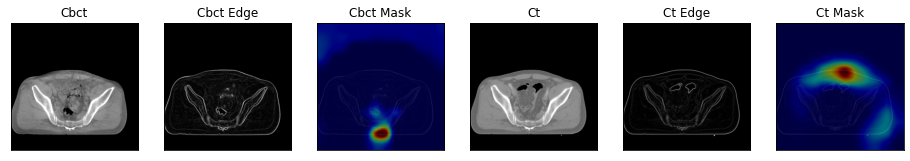

107it [00:38,  2.96it/s]

cbct prediction: 1, ct prediction: 0


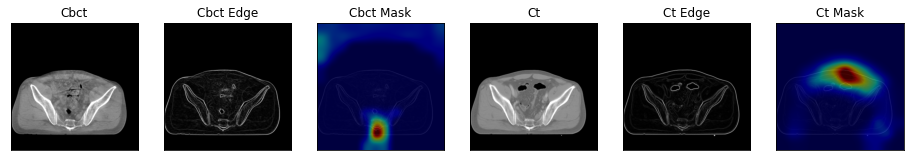

108it [00:38,  2.99it/s]

cbct prediction: 1, ct prediction: 0


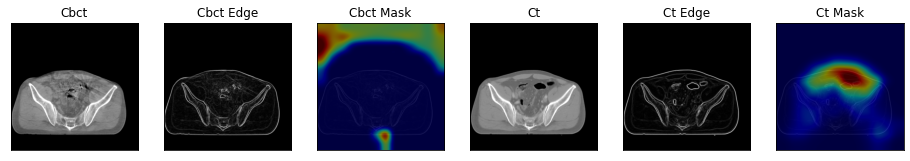

109it [00:38,  2.99it/s]

cbct prediction: 1, ct prediction: 0


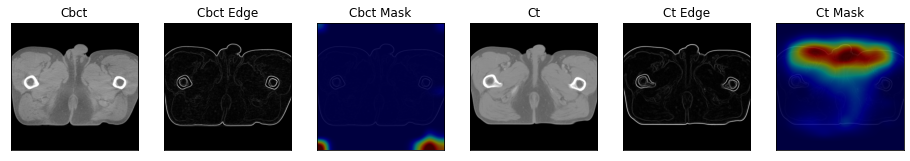

110it [00:39,  2.95it/s]

cbct prediction: 1, ct prediction: 0


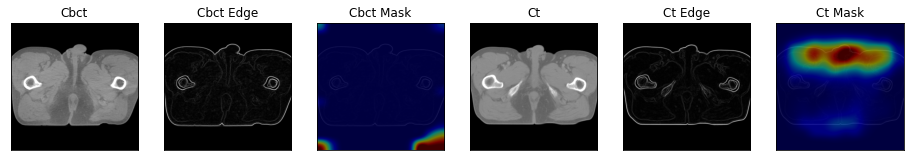

111it [00:39,  2.95it/s]

cbct prediction: 1, ct prediction: 0


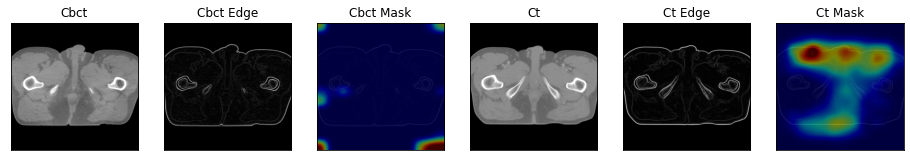

112it [00:39,  2.95it/s]

cbct prediction: 1, ct prediction: 0


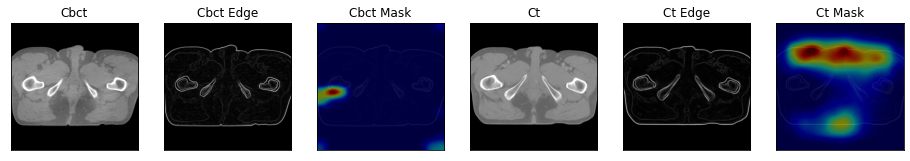

113it [00:40,  2.95it/s]

cbct prediction: 1, ct prediction: 0


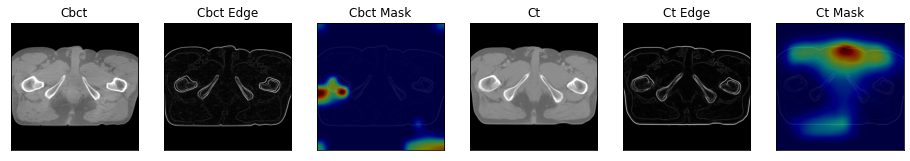

114it [00:40,  2.98it/s]

cbct prediction: 1, ct prediction: 0


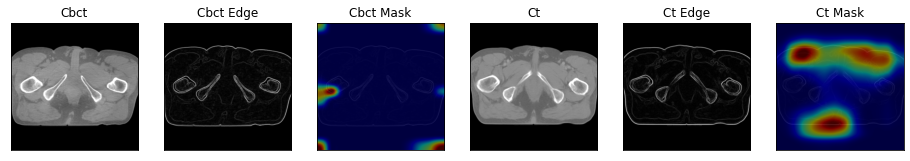

115it [00:40,  2.97it/s]

cbct prediction: 1, ct prediction: 0


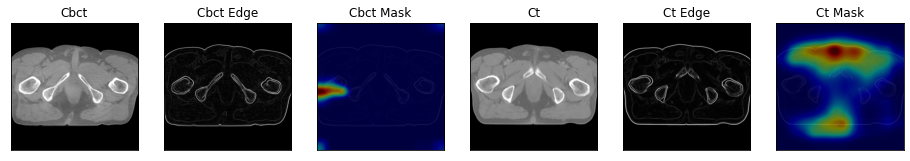

116it [00:41,  2.47it/s]

cbct prediction: 1, ct prediction: 0


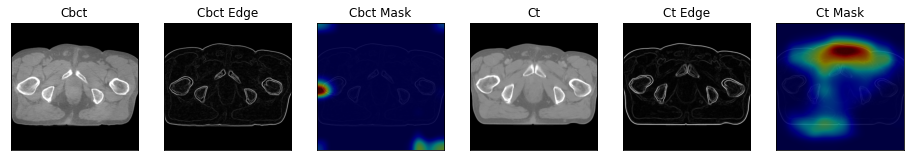

117it [00:41,  2.60it/s]

cbct prediction: 1, ct prediction: 0


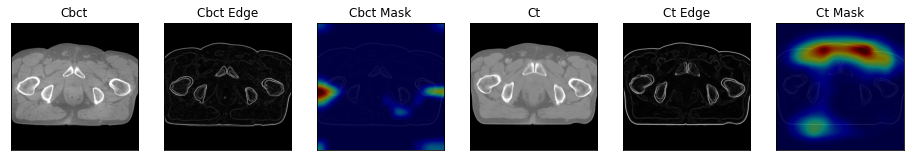

118it [00:42,  2.72it/s]

cbct prediction: 1, ct prediction: 0


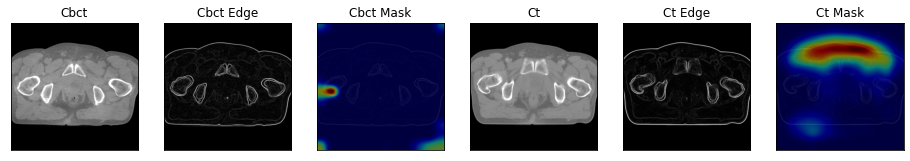

119it [00:42,  2.81it/s]

cbct prediction: 1, ct prediction: 0


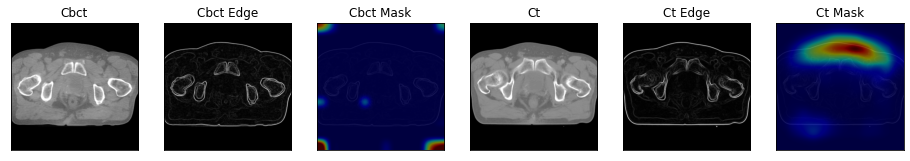

120it [00:42,  2.83it/s]

cbct prediction: 1, ct prediction: 0


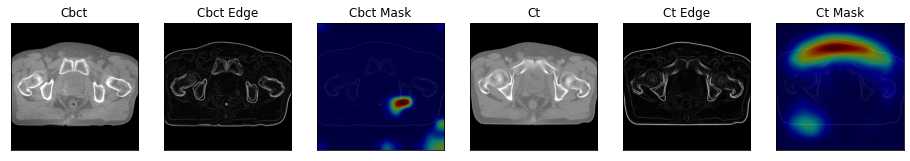

121it [00:43,  2.82it/s]

cbct prediction: 1, ct prediction: 0


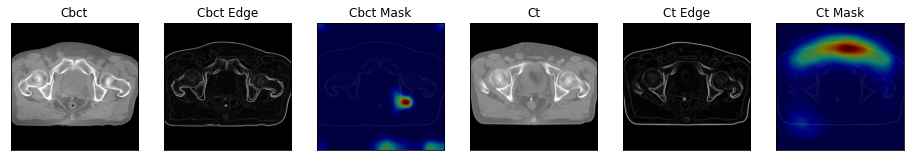

122it [00:43,  2.88it/s]

cbct prediction: 1, ct prediction: 0


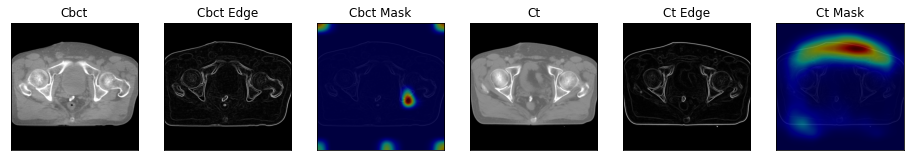

123it [00:43,  2.88it/s]

cbct prediction: 1, ct prediction: 0


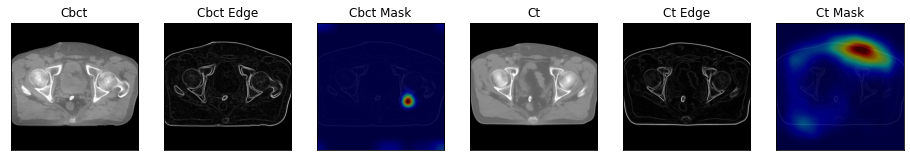

124it [00:44,  2.89it/s]

cbct prediction: 1, ct prediction: 0


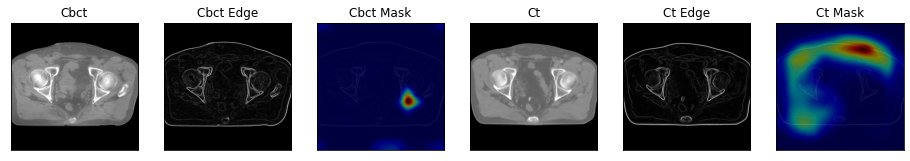

125it [00:44,  2.94it/s]

cbct prediction: 1, ct prediction: 0


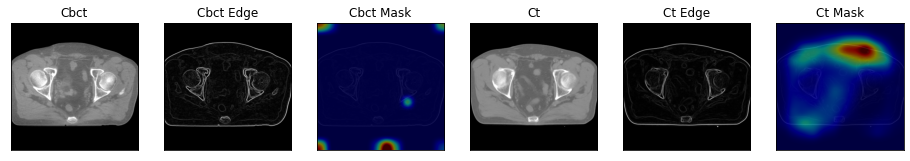

126it [00:44,  2.92it/s]

cbct prediction: 1, ct prediction: 0


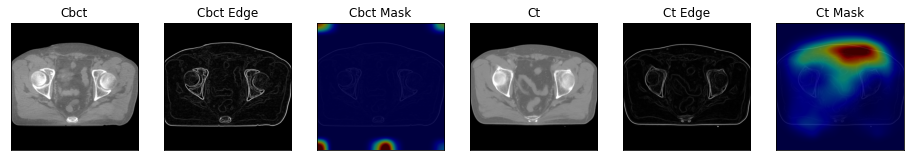

127it [00:45,  2.94it/s]

cbct prediction: 1, ct prediction: 0


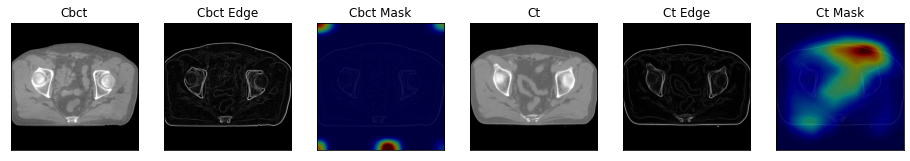

128it [00:45,  2.99it/s]

cbct prediction: 1, ct prediction: 0


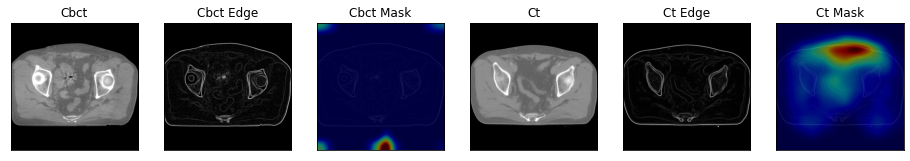

129it [00:45,  2.93it/s]

cbct prediction: 1, ct prediction: 0


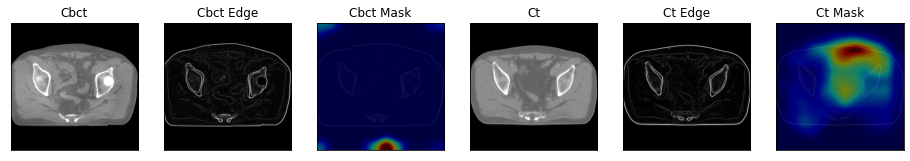

130it [00:46,  2.92it/s]

cbct prediction: 1, ct prediction: 0


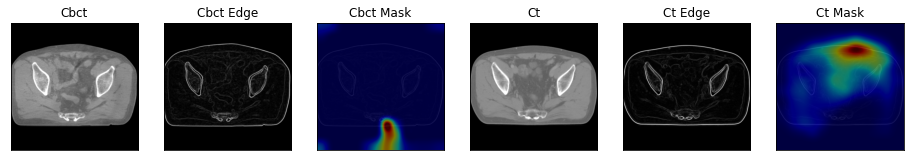

131it [00:46,  2.99it/s]

cbct prediction: 1, ct prediction: 0


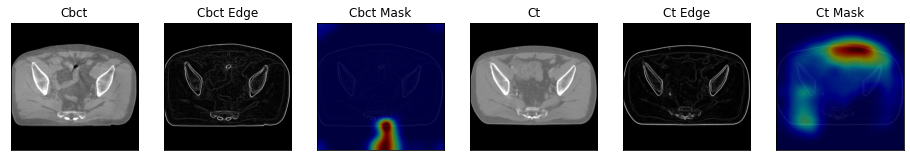

132it [00:46,  2.53it/s]

cbct prediction: 1, ct prediction: 0


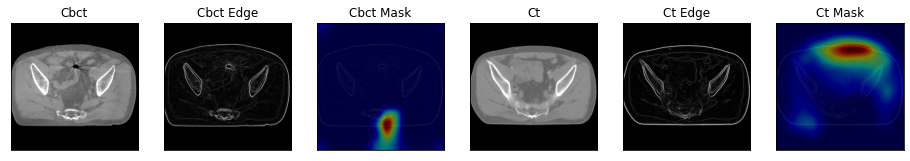

133it [00:47,  2.69it/s]

cbct prediction: 1, ct prediction: 0


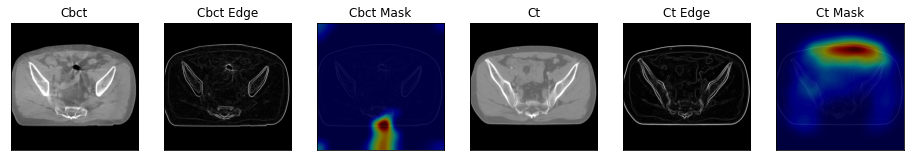

134it [00:47,  2.79it/s]

cbct prediction: 1, ct prediction: 0


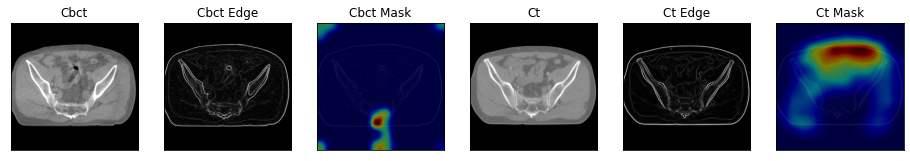

135it [00:47,  2.92it/s]

cbct prediction: 1, ct prediction: 0


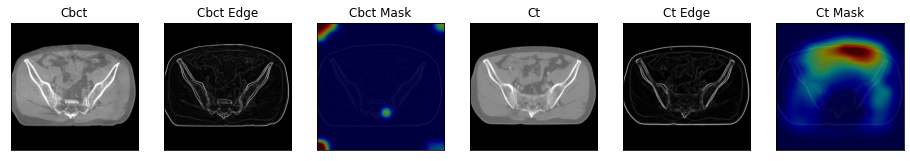

136it [00:48,  3.00it/s]

cbct prediction: 1, ct prediction: 0


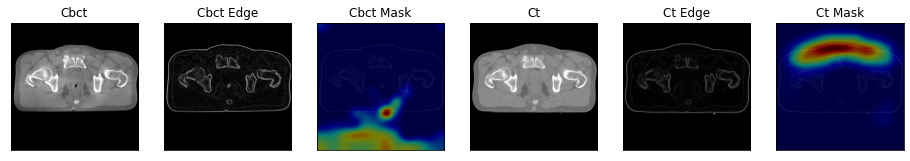

137it [00:48,  3.00it/s]

cbct prediction: 1, ct prediction: 0


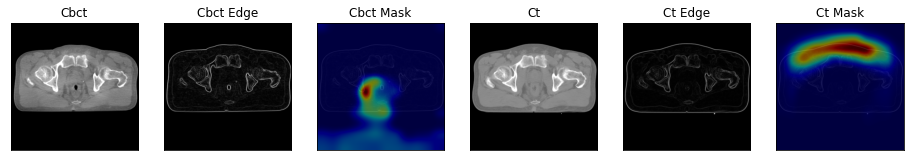

138it [00:48,  3.05it/s]

cbct prediction: 1, ct prediction: 0


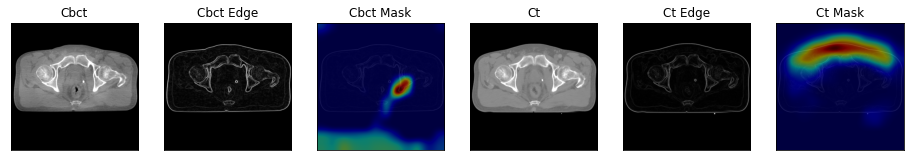

139it [00:49,  3.04it/s]

cbct prediction: 1, ct prediction: 0


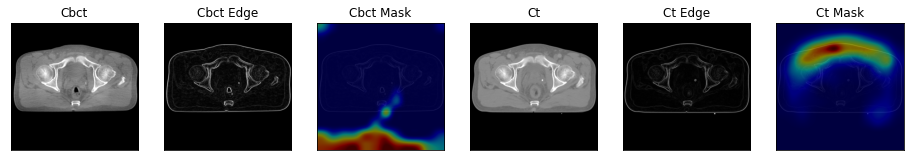

140it [00:49,  3.03it/s]

cbct prediction: 1, ct prediction: 0


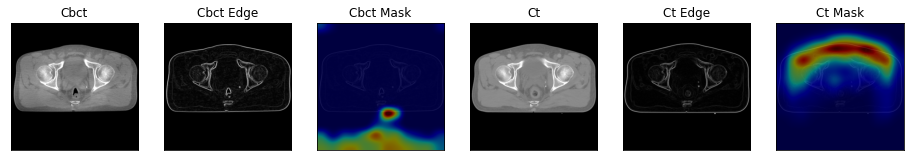

141it [00:49,  3.01it/s]

cbct prediction: 1, ct prediction: 0


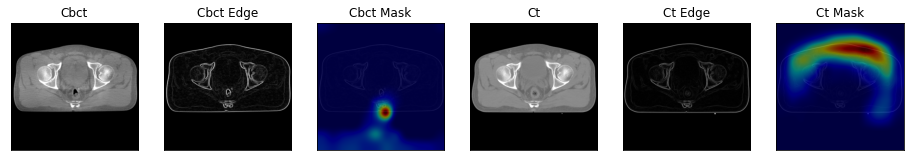

142it [00:50,  3.05it/s]

cbct prediction: 1, ct prediction: 0


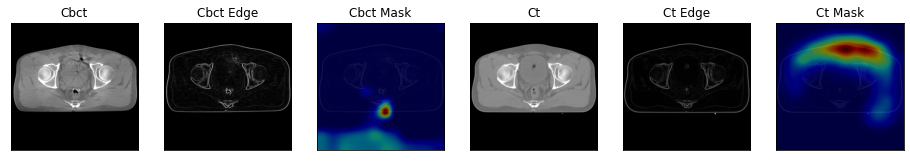

143it [00:50,  3.14it/s]

cbct prediction: 1, ct prediction: 0


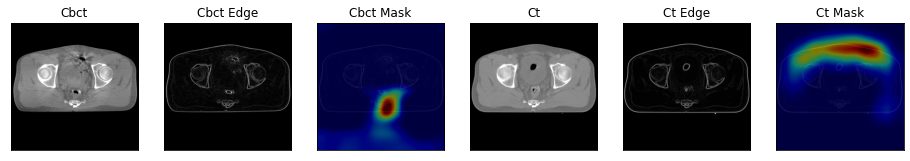

144it [00:50,  3.14it/s]

cbct prediction: 1, ct prediction: 0


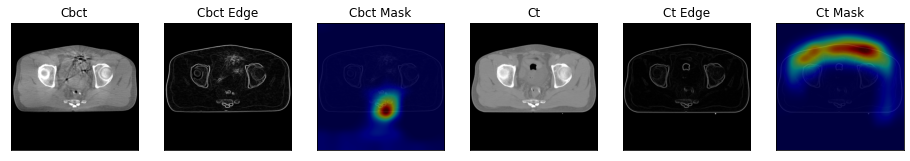

145it [00:51,  3.12it/s]

cbct prediction: 1, ct prediction: 0


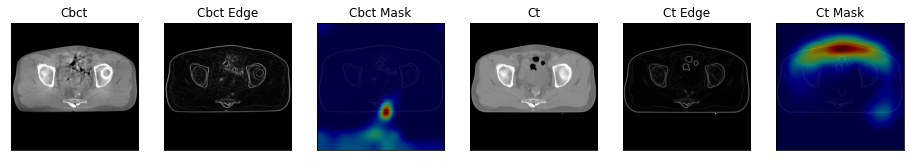

146it [00:51,  3.19it/s]

cbct prediction: 1, ct prediction: 0


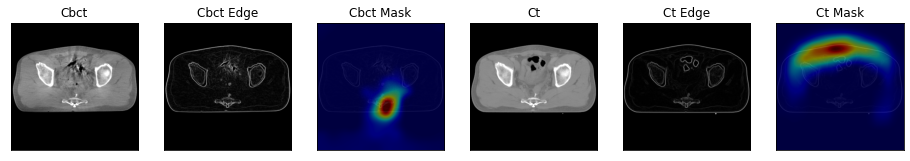

147it [00:51,  3.20it/s]

cbct prediction: 1, ct prediction: 0


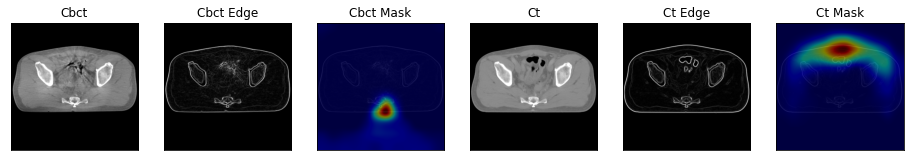

148it [00:52,  2.61it/s]

cbct prediction: 1, ct prediction: 0


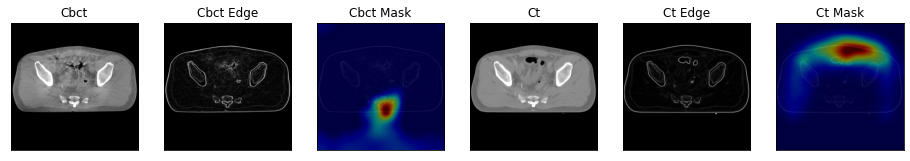

149it [00:52,  2.77it/s]

cbct prediction: 1, ct prediction: 0


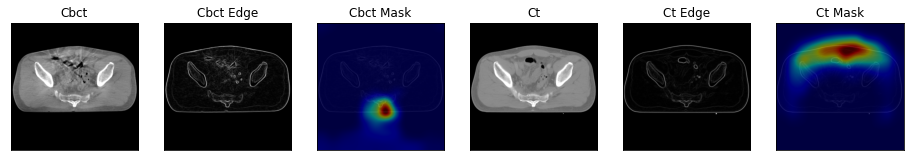

150it [00:52,  2.87it/s]

cbct prediction: 1, ct prediction: 0


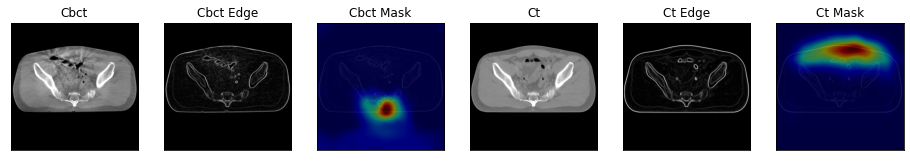

151it [00:53,  2.97it/s]

cbct prediction: 1, ct prediction: 0


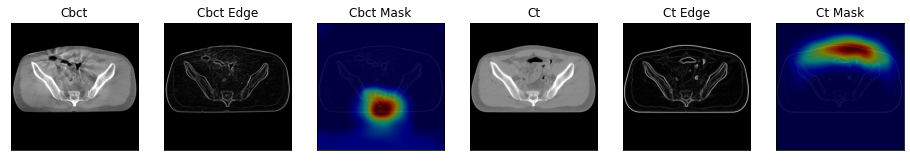

152it [00:53,  3.06it/s]

cbct prediction: 1, ct prediction: 0


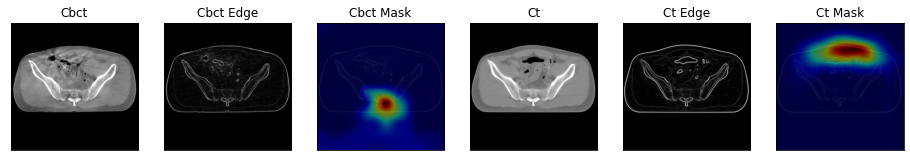

153it [00:53,  3.04it/s]

cbct prediction: 1, ct prediction: 0


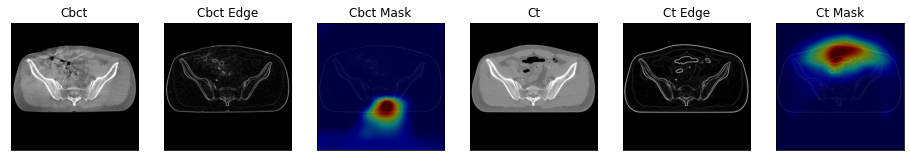

154it [00:54,  3.09it/s]

cbct prediction: 1, ct prediction: 0


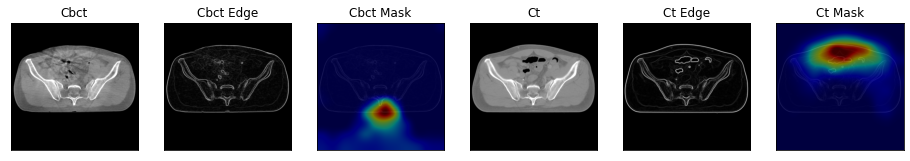

155it [00:54,  3.13it/s]

cbct prediction: 1, ct prediction: 0


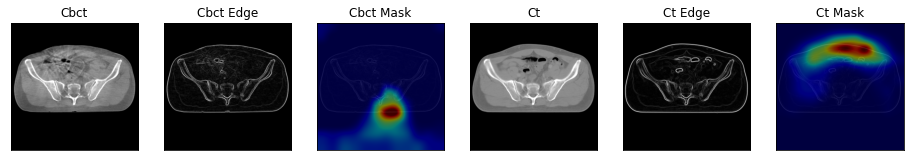

156it [00:54,  3.20it/s]

cbct prediction: 1, ct prediction: 0


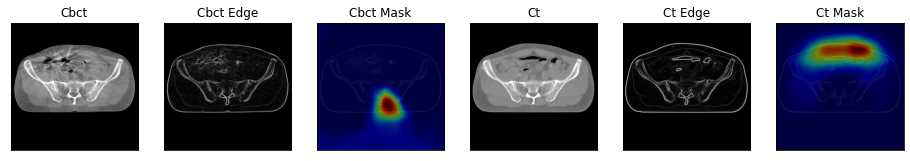

157it [00:55,  3.17it/s]

cbct prediction: 1, ct prediction: 0


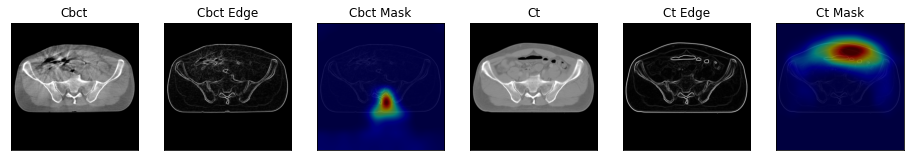

158it [00:55,  3.17it/s]

cbct prediction: 1, ct prediction: 0


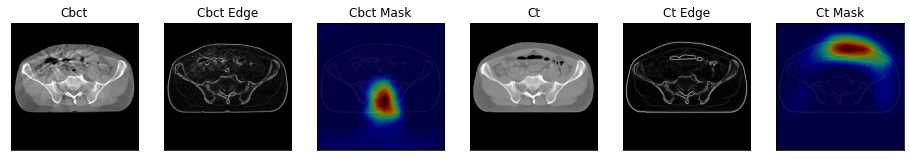

159it [00:55,  3.22it/s]

cbct prediction: 1, ct prediction: 0


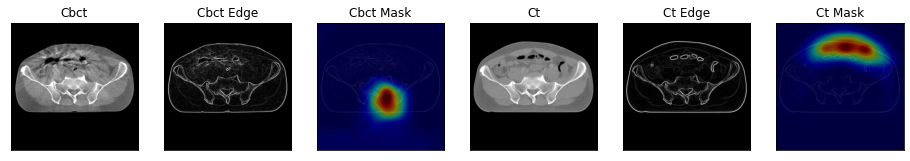

160it [00:56,  3.19it/s]

cbct prediction: 1, ct prediction: 0


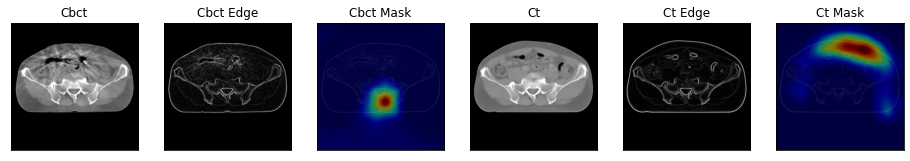

161it [00:56,  3.18it/s]

cbct prediction: 1, ct prediction: 0


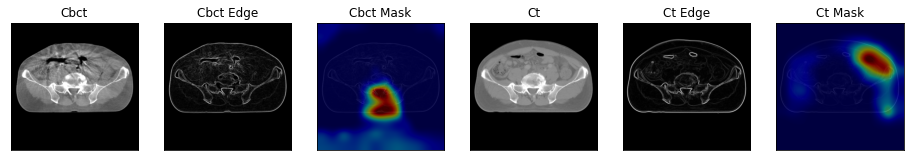

162it [00:56,  3.22it/s]

cbct prediction: 1, ct prediction: 0


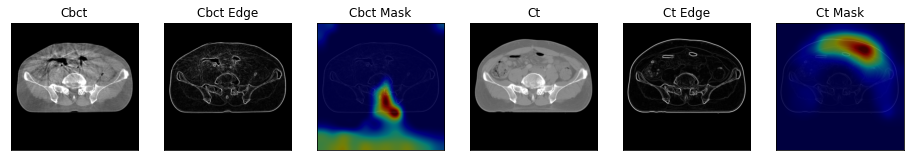

163it [00:57,  3.18it/s]

cbct prediction: 1, ct prediction: 0


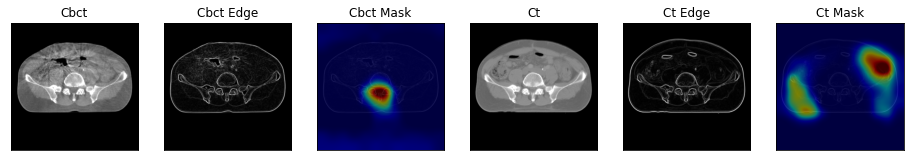

164it [00:57,  2.60it/s]

cbct prediction: 1, ct prediction: 0


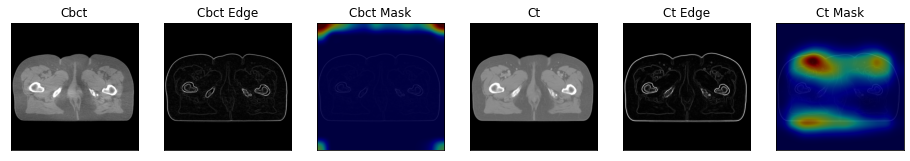

165it [00:57,  2.73it/s]

cbct prediction: 1, ct prediction: 0


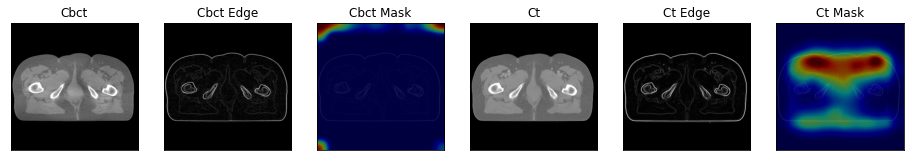

166it [00:58,  2.85it/s]

cbct prediction: 1, ct prediction: 0


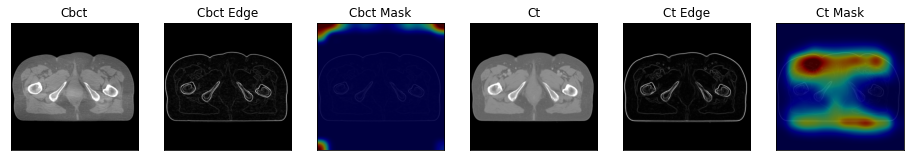

167it [00:58,  2.96it/s]

cbct prediction: 1, ct prediction: 0


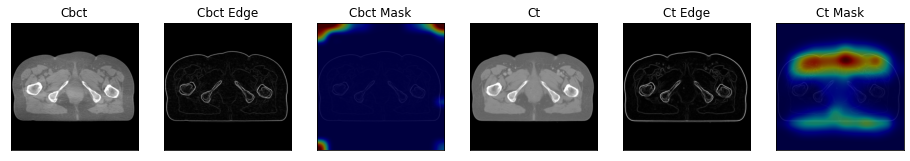

168it [00:58,  3.06it/s]

cbct prediction: 1, ct prediction: 0


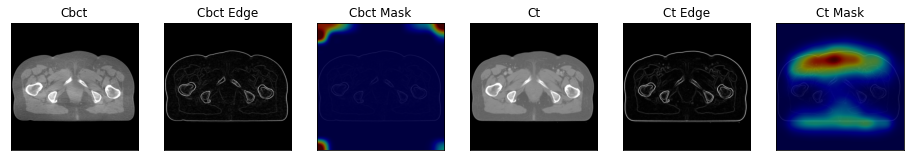

169it [00:59,  3.03it/s]

cbct prediction: 1, ct prediction: 0


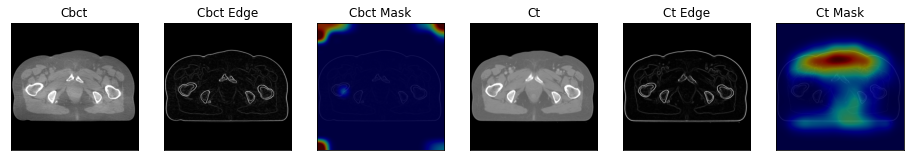

170it [00:59,  3.09it/s]

cbct prediction: 1, ct prediction: 0


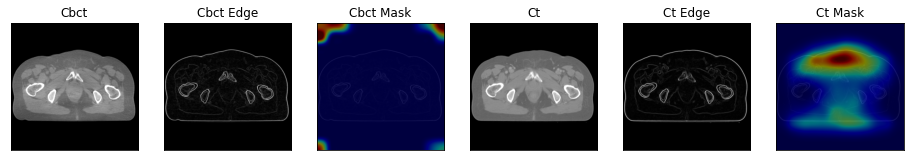

171it [00:59,  3.12it/s]

cbct prediction: 1, ct prediction: 0


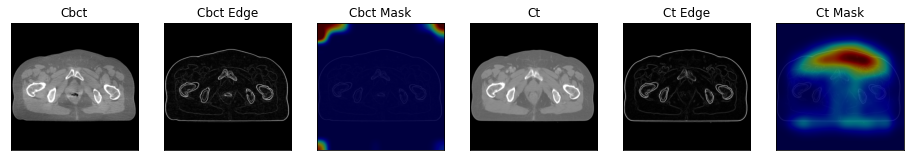

172it [01:00,  3.14it/s]

cbct prediction: 1, ct prediction: 0


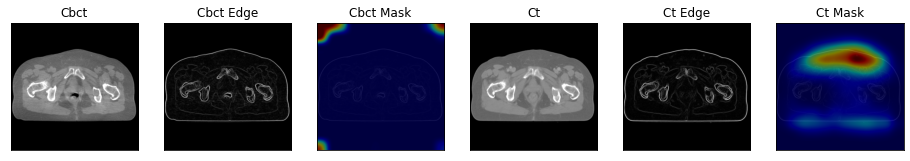

173it [01:00,  3.10it/s]

cbct prediction: 1, ct prediction: 0


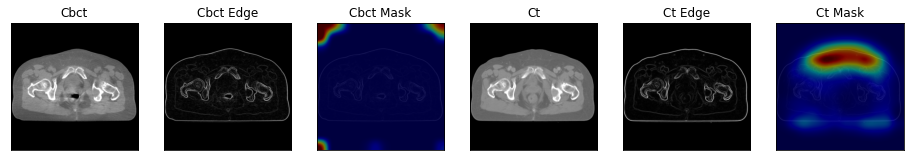

174it [01:00,  3.13it/s]

cbct prediction: 1, ct prediction: 0


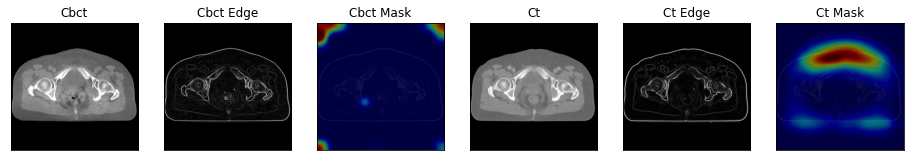

175it [01:01,  3.14it/s]

cbct prediction: 1, ct prediction: 0


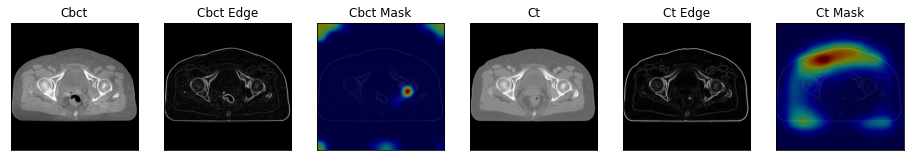

176it [01:01,  3.11it/s]

cbct prediction: 1, ct prediction: 0


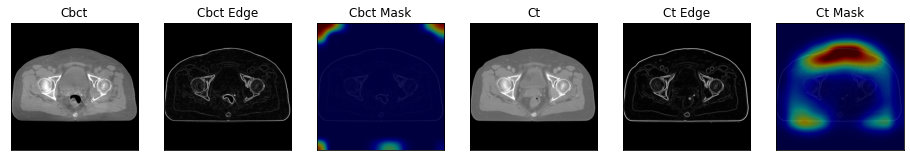

177it [01:01,  3.14it/s]

cbct prediction: 1, ct prediction: 0


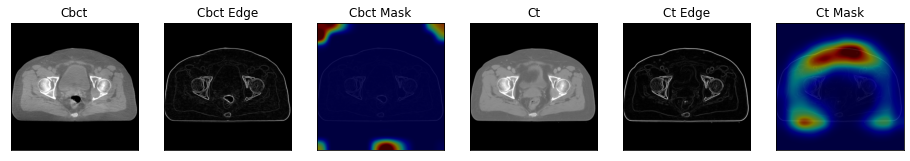

178it [01:01,  3.15it/s]

cbct prediction: 1, ct prediction: 0


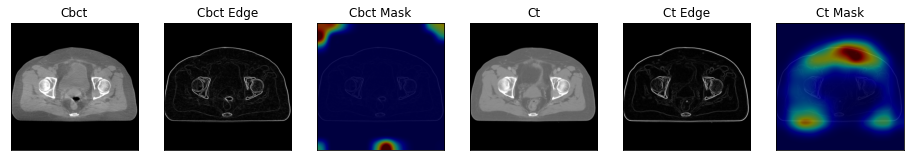

179it [01:02,  3.14it/s]

cbct prediction: 1, ct prediction: 0


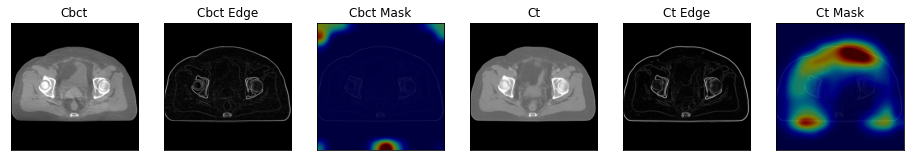

180it [01:02,  2.60it/s]

cbct prediction: 1, ct prediction: 0


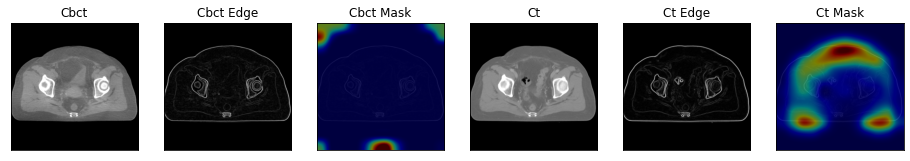

181it [01:03,  2.76it/s]

cbct prediction: 1, ct prediction: 0


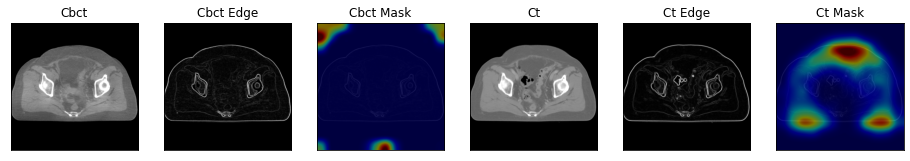

182it [01:03,  2.72it/s]

cbct prediction: 1, ct prediction: 0


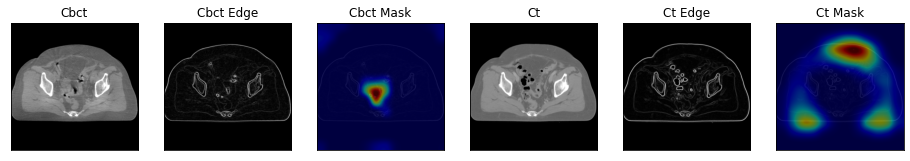

183it [01:03,  2.77it/s]

cbct prediction: 1, ct prediction: 0


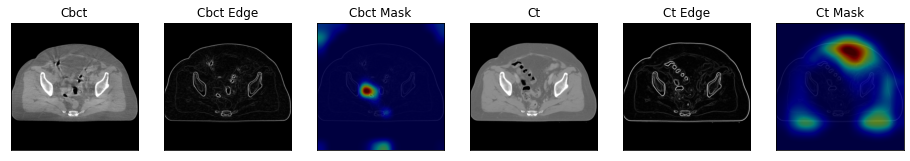

184it [01:04,  2.82it/s]

cbct prediction: 1, ct prediction: 0


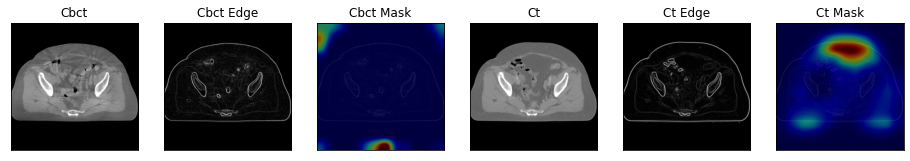

185it [01:04,  2.59it/s]

cbct prediction: 1, ct prediction: 0


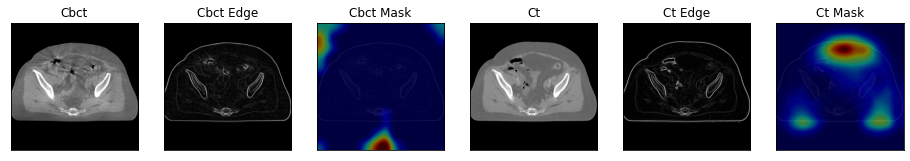

186it [01:05,  1.91it/s]

cbct prediction: 1, ct prediction: 0


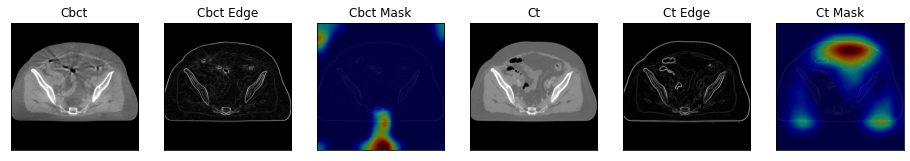

187it [01:06,  1.52it/s]

cbct prediction: 1, ct prediction: 0


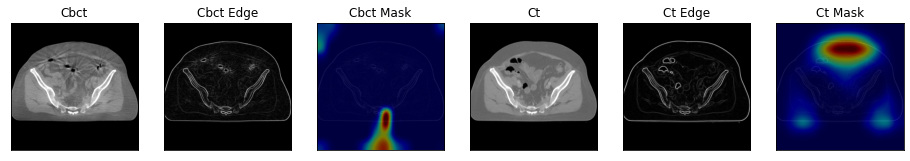

188it [01:07,  1.37it/s]

cbct prediction: 1, ct prediction: 0


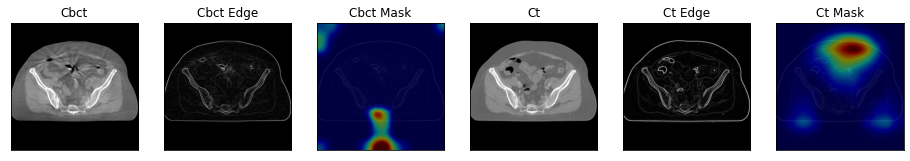

189it [01:08,  1.18it/s]

cbct prediction: 1, ct prediction: 0


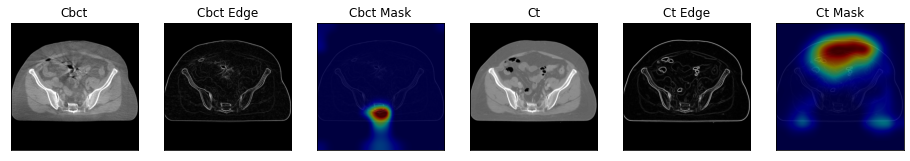

190it [01:09,  1.16it/s]

cbct prediction: 1, ct prediction: 0


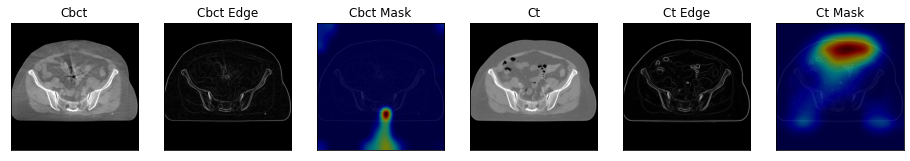

191it [01:10,  2.71it/s]


In [48]:
testloader = torch.utils.data.DataLoader(testset, batch_size=1, shuffle=False, num_workers=4)
test_epoch(model, testloader, device, True, path_dir)